In [245]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.linear_model import ElasticNet, Lasso, Ridge, LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, make_scorer, r2_score
from sklearn.pipeline import Pipeline
from scipy.stats import norm, skew, kurtosis
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold
from xgboost import XGBRegressor
from sklearn.metrics import fbeta_score, make_scorer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import pymssql as mssql
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import pandas as pd

In [246]:
# 그래프 그리기 위한 matplolib
%matplotlib inline
plt.style.use('ggplot')
#폰트깨짐방지
mpl.rcParams['axes.unicode_minus']=False

In [247]:
OriginAnswer = pd.read_csv("submission_outclear.csv",parse_dates=["datetime"])

## - 변수 선택후 결과 뽑아내는 과정 (반복작업)

In [248]:
train_outclear = pd.read_csv("train_outclear.csv", parse_dates=["datetime"])

In [249]:
train_outclear.head()

,datetime,tourday,b1,b2,b3,f1,f2,f3,f4,x1,...,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3,count
0,2015-01-01,9,2,12,101,3,456,30,0,0,...,0,0,0,0,0,0,53,0,62,321
1,2015-01-02,9,3,2,81,3,304,27,-1,0,...,2,0,0,0,0,0,44,0,42,271
2,2015-01-03,8,1,4,81,3,285,14,-1,0,...,0,0,0,0,0,0,39,0,47,315
3,2015-01-04,9,2,3,82,4,349,23,0,0,...,0,0,0,0,1,0,37,0,50,271
4,2015-01-05,10,4,5,54,3,202,20,0,1,...,0,0,0,0,0,0,39,0,24,109


In [250]:
test_outclear = pd.read_csv("test_outclear.csv", parse_dates=["datetime"])

In [251]:
test_outclear.head()

,datetime,tourday,b1,b2,b3,f1,f2,f3,f4,x1,...,ar23,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3
0,2019-01-01,9,7,1,84,4,418,13,0,0,...,0,0,0,0,0,0,0,48,1,43
1,2019-01-02,9,9,2,94,4,450,34,0,0,...,0,0,0,0,0,0,0,52,1,52
2,2019-01-03,9,9,2,83,3,316,13,0,0,...,0,0,0,0,0,0,0,52,1,41
3,2019-01-04,9,1,2,72,3,262,28,0,0,...,0,1,0,0,0,0,0,33,1,41
4,2019-01-05,9,6,0,68,3,222,15,0,0,...,0,0,0,0,0,0,0,35,1,38


In [252]:
##새로 탐색하는 데이터에 결측치가 있는지 없는지 체크
train_outclear.columns[train_outclear.isna().any()].tolist()

[]

In [253]:
##새로 탐색하는 데이터에 결측치가 있는지 없는지 체크
test_outclear.columns[test_outclear.isna().any()].tolist()

[]

In [254]:
X_train = train_outclear.copy()
X_test = test_outclear.copy()

In [255]:
## 정규화 진행 전 datetime과 count는 제외시키고 진행해야 되기 때문에 iloc으로 해당 위치 컬럼만 불러옴
X_train.iloc[:,1:-1]

,tourday,b1,b2,b3,f1,f2,f3,f4,x1,x2,...,ar23,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3
0,9,2,12,101,3,456,30,0,0,4,...,0,0,0,0,0,0,0,53,0,62
1,9,3,2,81,3,304,27,-1,0,65,...,0,2,0,0,0,0,0,44,0,42
2,8,1,4,81,3,285,14,-1,0,38,...,0,0,0,0,0,0,0,39,0,47
3,9,2,3,82,4,349,23,0,0,36,...,0,0,0,0,0,1,0,37,0,50
4,10,4,5,54,3,202,20,0,1,90,...,0,0,0,0,0,0,0,39,0,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,9,7,1,117,4,602,27,0,0,20,...,0,0,0,0,0,0,0,76,1,48
1457,9,3,2,99,3,396,22,0,0,36,...,0,0,0,0,0,0,0,42,1,61
1458,9,8,5,113,4,541,33,-1,0,19,...,0,0,0,0,0,0,0,73,1,52
1459,9,8,2,102,3,443,26,-2,0,30,...,0,0,0,0,0,1,0,54,1,57


In [256]:
## 우선 표준정규화를 진행해볼예정
scaler = StandardScaler()

In [257]:
## datetime과 count를 제외하고 해당 feature들만 정규화 하기위해 iloc을 사용
fit_train = scaler.fit_transform(X_train.iloc[:,1:-1])

In [258]:
## 정규화된 값들의 array
fit_train

array([[-0.26671651, -1.33552104,  3.98062512, ..., -0.51266625,
        -0.47567415,  0.72289928],
       [-0.26671651, -1.0379465 , -0.09056375, ..., -1.00884236,
        -0.47567415, -1.01106205],
       [-3.05009377, -1.63309557,  0.72367402, ..., -1.28449575,
        -0.47567415, -0.57757172],
       ...,
       [-0.26671651,  0.44992618,  1.13079291, ...,  0.58994732,
         0.72876248, -0.14408139],
       [-0.26671651,  0.44992618, -0.09056375, ..., -0.45753558,
         0.72876248,  0.28940895],
       [ 2.51666075,  1.04507525, -0.49768264, ..., -1.33962643,
        -0.47567415, -0.40417558]])

In [259]:
## 정규화된 array 값들을 기존의 데이터에서 정규화 데이터로 교체 진행
X_train.iloc[:,1:-1] = fit_train

In [260]:
## 정규화가 완료된 트레인 데이터
X_train.head()

,datetime,tourday,b1,b2,b3,f1,f2,f3,f4,x1,...,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3,count
0,2015-01-01,-0.266717,-1.335521,3.980625,-0.272303,-0.180422,0.185103,0.636180,0.441235,-0.330490,...,-0.446512,0.0,-0.026171,-0.37035,-0.402854,-0.284131,-0.512666,-0.475674,0.722899,321
1,2015-01-02,-0.266717,-1.037946,-0.090564,-1.091819,-0.180422,-0.861253,0.383197,0.281867,-0.330490,...,1.576291,0.0,-0.026171,-0.37035,-0.402854,-0.284131,-1.008842,-0.475674,-1.011062,271
2,2015-01-03,-3.050094,-1.633096,0.723674,-1.091819,-0.180422,-0.992048,-0.713061,0.281867,-0.330490,...,-0.446512,0.0,-0.026171,-0.37035,-0.402854,-0.284131,-1.284496,-0.475674,-0.577572,315
3,2015-01-04,-0.266717,-1.335521,0.316555,-1.050843,0.913342,-0.551477,0.045887,0.441235,-0.330490,...,-0.446512,0.0,-0.026171,-0.37035,2.482290,-0.284131,-1.394757,-0.475674,-0.317478,271
4,2015-01-05,2.516661,-0.740372,1.130793,-2.198165,-0.180422,-1.563413,-0.207096,0.441235,2.784642,...,-0.446512,0.0,-0.026171,-0.37035,-0.402854,-0.284131,-1.284496,-0.475674,-2.571627,109


In [261]:
## 테스터 데이터도 진행
X_test.iloc[:,1:]

,tourday,b1,b2,b3,f1,f2,f3,f4,x1,x2,...,ar23,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3
0,9,7,1,84,4,418,13,0,0,45,...,0,0,0,0,0,0,0,48,1,43
1,9,9,2,94,4,450,34,0,0,83,...,0,0,0,0,0,0,0,52,1,52
2,9,9,2,83,3,316,13,0,0,20,...,0,0,0,0,0,0,0,52,1,41
3,9,1,2,72,3,262,28,0,0,31,...,0,1,0,0,0,0,0,33,1,41
4,9,6,0,68,3,222,15,0,0,46,...,0,0,0,0,0,0,0,35,1,38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,8,3,5,32,1,56,27,-4,0,38,...,0,1,0,0,0,0,0,21,0,19
361,8,5,1,22,0,-10,0,-8,0,-3,...,0,0,0,0,0,0,0,17,0,11
362,9,4,3,41,1,74,10,0,0,42,...,0,0,0,0,0,0,0,31,0,17
363,10,6,0,19,1,44,13,-15,1,31,...,0,0,0,0,0,0,0,11,0,14


In [262]:
fit_test = scaler.fit_transform(X_test.iloc[:,1:])

In [263]:
fit_test

array([[-0.25668645, -0.31253813, -0.53554281, ...,  0.78829106,
        -0.08918339,  0.21360529],
       [-0.25668645,  0.2636054 , -0.03044429, ...,  1.13896289,
        -0.08918339,  0.95222989],
       [-0.25668645,  0.2636054 , -0.03044429, ...,  1.13896289,
        -0.08918339,  0.04946649],
       ...,
       [-0.25668645, -1.17675343,  0.47465422, ..., -0.70206422,
        -1.39126095, -1.92019911],
       [ 2.20885449, -0.6006099 , -1.04064133, ..., -2.45542336,
        -1.39126095, -2.16640731],
       [-0.25668645, -0.88868167, -1.04064133, ..., -0.78973217,
        -1.39126095, -1.50985211]])

In [264]:
X_test.iloc[:,1:] = fit_test

In [265]:
X_test

,datetime,tourday,b1,b2,b3,f1,f2,f3,f4,x1,...,ar23,ar24,ar25,ar26,ar27,ar28,ar29,art1,art2,art3
0,2019-01-01,-0.256686,-0.312538,-0.535543,0.684917,0.932320,0.989744,-1.423688,0.561462,-0.645081,...,-0.384814,-0.635489,0.0,0.0,0.0,0.0,0.0,0.788291,-0.089183,0.213605
1,2019-01-02,-0.256686,0.263605,-0.030444,1.185909,0.932320,1.244570,1.908394,0.561462,-0.645081,...,-0.384814,-0.635489,0.0,0.0,0.0,0.0,0.0,1.138963,-0.089183,0.952230
2,2019-01-03,-0.256686,0.263605,-0.030444,0.634818,-0.034432,0.177484,-1.423688,0.561462,-0.645081,...,-0.384814,-0.635489,0.0,0.0,0.0,0.0,0.0,1.138963,-0.089183,0.049466
3,2019-01-04,-0.256686,-2.040969,-0.030444,0.083727,-0.034432,-0.252536,0.956371,0.561462,-0.645081,...,-0.384814,1.573592,0.0,0.0,0.0,0.0,0.0,-0.526728,-0.089183,0.049466
4,2019-01-05,-0.256686,-0.600610,-1.040641,-0.116669,-0.034432,-0.571069,-1.106347,0.561462,-0.645081,...,-0.384814,-0.635489,0.0,0.0,0.0,0.0,0.0,-0.351392,-0.089183,-0.196742
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,2019-12-27,-2.722227,-1.464825,1.484851,-1.920240,-1.967937,-1.892982,0.797700,-0.090674,-0.645081,...,-0.384814,1.573592,0.0,0.0,0.0,0.0,0.0,-1.578744,-1.391261,-1.756060
361,2019-12-28,-2.722227,-0.888682,-0.535543,-2.421231,-2.934690,-2.418562,-3.486406,-0.742809,-0.645081,...,-0.384814,-0.635489,0.0,0.0,0.0,0.0,0.0,-1.929416,-1.391261,-2.412616
362,2019-12-29,-0.256686,-1.176753,0.474654,-1.469347,-1.967937,-1.749642,-1.899700,0.561462,-0.645081,...,-0.384814,-0.635489,0.0,0.0,0.0,0.0,0.0,-0.702064,-1.391261,-1.920199
363,2019-12-30,2.208854,-0.600610,-1.040641,-2.571529,-1.967937,-1.988542,-1.423688,-1.884047,1.013050,...,-0.384814,-0.635489,0.0,0.0,0.0,0.0,0.0,-2.455423,-1.391261,-2.166407


In [266]:
X_train['year']=X_train["datetime"].dt.year
X_train['month']=X_train["datetime"].dt.month
X_train['week']=X_train["datetime"].dt.week
X_train['day']=X_train["datetime"].dt.day
X_train["dayofweek"] = X_train["datetime"].dt.dayofweek

X_test["year"] = X_test["datetime"].dt.year
X_test["month"] = X_test["datetime"].dt.month
X_test['week']= X_test["datetime"].dt.week
X_test["day"] = X_test["datetime"].dt.day
X_test["dayofweek"] = X_test["datetime"].dt.dayofweek

In [267]:
## 시즌 데이터 추가
def badToRight(month):
    if month in [12,1,2]:
        return 4 ## 겨울
    elif month in [3,4,5]:
        return 1 ## 봄
    elif month in [6,7,8]:
        return 2 ## 여름
    elif month in [9,10,11]:
        return 3 ## 가을

X_train['season'] = X_train.month.apply(badToRight)

## 시즌 데이터 추가
def badToRight(month):
    if month in [12,1,2]:
        return 4 ## 겨울
    elif month in [3,4,5]:
        return 1 ## 봄
    elif month in [6,7,8]:
        return 2 ## 여름
    elif month in [9,10,11]:
        return 3 ## 가을

X_test['season'] = X_test.month.apply(badToRight)

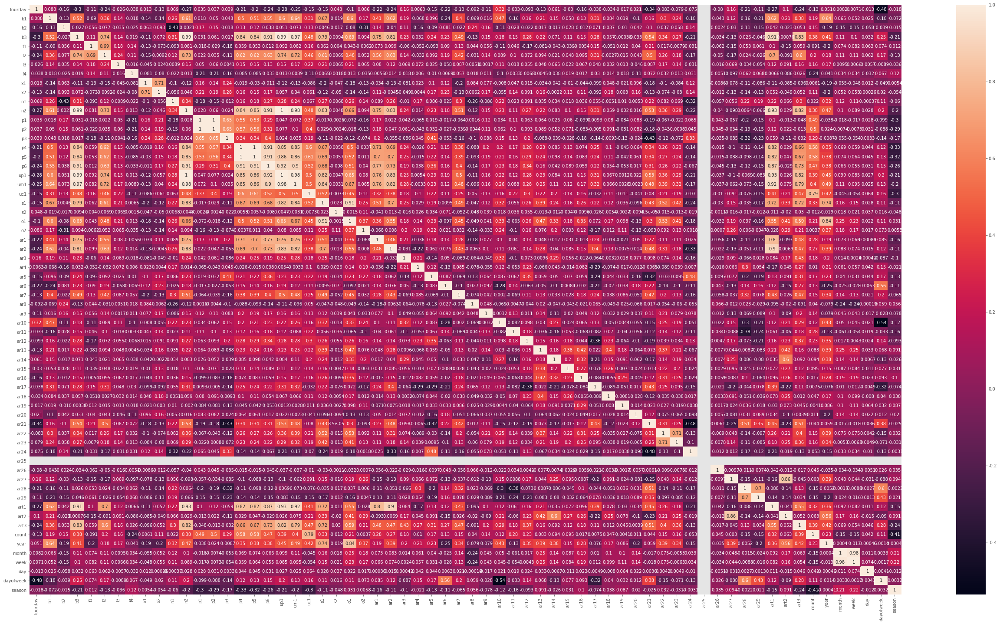

In [268]:
## 상관관계도를 시각화
transformed_corr_x = X_train.corr()
plt.figure(figsize=(45,25))
sns.heatmap(transformed_corr_x, annot=True)

### 양의 상관계수를 가지는 변수
- "b1","b2","b3","f2","f3","x1","x2","n1","n2","p1","p2","p3","p4","p5","p6","up1","um1","uc1","s1","o1","o2","ar1","ar2","ar3","ar4","ar5","ar6","ar7","ar8","ar9","ar10","ar11","ar12","ar13","ar14","ar15","ar16","ar17","ar18","ar20","ar21","ar22","ar23","ar26","ar27","art1","art2","art3", "year", "day","dayofweek"

### 0.1이상 양의 상관계수 변수
- "b1","b2","b3","f2","f3","x2","n2","p1","p2","p3","p4","p5","p6","up1","um1","uc1","s1","o1","ar1",ar2","ar3","ar4","ar5","ar6","ar7","ar8","ar9","ar10","ar11","ar12","ar22,"ar23,"art1",art2","art3","dayofweek"


## 1. 양의 상관계수를 가지는 변수들 랜덤포레스트 진행

In [269]:
feature_names = ["b1","b2","b3","f2","f3","x1","x2","n1","n2","p1","p2","p3","p4","p5","p6","up1","um1","uc1","s1","o1","o2","ar1","ar2","ar3","ar4","ar5","ar6","ar7","ar8","ar9","ar10","ar11","ar12","ar13","ar14","ar15","ar16","ar17","ar18","ar20","ar21","ar22","ar23","ar26","ar27","art1","art2","art3","year","day","dayofweek"]

In [270]:
from sklearn.metrics import make_scorer

def rmsle(predicted_values, actual_values):
    # 넘파이로 배열 형태로 바꿔준다.
    predicted_values = np.array(predicted_values)
    actual_values = np.array(actual_values)
    
    # 예측값과 실제 값에 1을 더하고 로그를 씌워준다.
    log_predict = np.log(predicted_values + 1)
    log_actual = np.log(actual_values + 1)
    
    # 위에서 계산한 예측값에서 실제값을 빼주고 제곱을 해준다.
    difference = log_predict - log_actual
    # difference = (log_predict - log_actual) ** 2
    difference = np.square(difference)
    
    # 평균을 낸다.
    mean_difference = difference.mean()
    
    # 다시 루트를 씌운다.
    score = np.sqrt(mean_difference)
    
    return score

rmsle_scorer = make_scorer(rmsle)
rmsle_scorer

make_scorer(rmsle)

In [271]:
T_train = X_train[feature_names]
print(T_train.shape)
T_train.head()

(1461, 51)


,b1,b2,b3,f2,f3,x1,x2,n1,n2,p1,...,ar22,ar23,ar26,ar27,art1,art2,art3,year,day,dayofweek
0,-1.335521,3.980625,-0.272303,0.185103,0.636180,-0.330490,-0.851313,-2.162340,-0.241092,0.285035,...,-0.342492,-0.297406,-0.026171,-0.37035,-0.512666,-0.475674,0.722899,2015,1,3
1,-1.037946,-0.090564,-1.091819,-0.861253,0.383197,-0.330490,0.407082,-2.162340,-1.225051,0.480704,...,-0.342492,-0.297406,-0.026171,-0.37035,-1.008842,-0.475674,-1.011062,2015,2,4
2,-1.633096,0.723674,-1.091819,-0.992048,-0.713061,-0.330490,-0.149913,-2.162340,-1.272357,-0.528512,...,-0.342492,-0.297406,-0.026171,-0.37035,-1.284496,-0.475674,-0.577572,2015,3,5
3,-1.335521,0.316555,-1.050843,-0.551477,0.045887,-0.330490,-0.191172,0.158879,-1.064212,-0.385462,...,-0.342492,-0.297406,-0.026171,-0.37035,-1.394757,-0.475674,-0.317478,2015,4,6
4,-0.740372,1.130793,-2.198165,-1.563413,-0.207096,2.784642,0.922817,-2.162340,-2.080339,1.216212,...,-0.342492,-0.297406,-0.026171,-0.37035,-1.284496,-0.475674,-2.571627,2015,5,0


In [272]:
T_test = X_test[feature_names]

print(T_test.shape)
T_test.head()

(365, 51)


,b1,b2,b3,f2,f3,x1,x2,n1,n2,p1,...,ar22,ar23,ar26,ar27,art1,art2,art3,year,day,dayofweek
0,-0.312538,-0.535543,0.684917,0.989744,-1.423688,-0.645081,-0.462806,0.201454,0.577113,-0.970666,...,1.123828,-0.384814,0.0,0.0,0.788291,-0.089183,0.213605,2019,1,1
1,0.263605,-0.030444,1.185909,1.244570,1.908394,-0.645081,0.386172,0.201454,1.071577,-0.606641,...,-0.795972,-0.384814,0.0,0.0,1.138963,-0.089183,0.952230,2019,2,2
2,0.263605,-0.030444,0.634818,0.177484,-1.423688,-0.645081,-1.021344,0.201454,0.657607,-0.756877,...,-0.795972,-0.384814,0.0,0.0,1.138963,-0.089183,0.049466,2019,3,3
3,-2.040969,-0.030444,0.083727,-0.252536,0.956371,-0.645081,-0.775588,0.201454,-0.287624,-1.239850,...,-0.156039,-0.384814,0.0,0.0,-0.526728,-0.089183,0.049466,2019,4,4
4,-0.600610,-1.040641,-0.116669,-0.571069,-1.106347,-0.645081,-0.440465,0.201454,-0.285324,-0.683875,...,0.483895,-0.384814,0.0,0.0,-0.351392,-0.089183,-0.196742,2019,5,5


In [273]:
## 정답컬럼 추출
label_name = "count"

Y_train = X_train[label_name]

print(Y_train.shape)
Y_train.head()

(1461,)


0    321
1    271
2    315
3    271
4    109
Name: count, dtype: int64

In [274]:
from sklearn.ensemble import RandomForestRegressor

max_depth_list = []

model = RandomForestRegressor(n_estimators=100,
                              n_jobs=-1,
                              random_state=0)
model

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

In [275]:
# 학습시킴, 피팅(옷을 맞출 때 사용하는 피팅을 생각함) - 피처와 레이블을 넣어주면 알아서 학습을 함
model.fit(T_train, Y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

In [276]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

k_fold = KFold(n_splits=10, shuffle=True, random_state=0)
%time score = cross_val_score(model, T_train,Y_train, cv=k_fold, scoring=rmsle_scorer)
score = score.mean()
# 0에 근접할수록 좋은 데이터
print("Score= {0:.5f}".format(score))

Wall time: 5.47 s
Score= 0.26452


In [277]:
pred = model.predict(T_test)
pred = np.round(pred,0).astype(int)
print(pred.shape)
pred[0:10]

(365,)


array([134, 279, 183, 224, 188, 232, 184, 187, 169, 200])

In [278]:
submission = pd.read_csv("sampleSubmission.csv")
submission

submission["count"] = pred

print(submission.shape)
submission.head()

(365, 2)


,datetime,count
0,2019-01-01,134
1,2019-01-02,279
2,2019-01-03,183
3,2019-01-04,224
4,2019-01-05,188


In [ ]:
submission.to_csv(f"submission_third(timeadd).csv", index=False)

In [284]:
sub_1 = pd.read_csv("submission_third(timeadd).csv", parse_dates=["datetime"])

In [286]:
sub_1 = sub_1['count']

### 1.1 count와 상관관계가 양의 값을 가지는 변수들을 전부다 단순히 사용했을때 예측값

In [287]:
## 예측데이터 조회
sub_1

0      134
1      279
2      183
3      224
4      188
      ... 
360    237
361     89
362    273
363     96
364    152
Name: count, Length: 365, dtype: int64

In [288]:
## 정답데이터 조회
Answer

0      147
1      284
2      238
3      222
4      231
      ... 
360    412
361    218
362    485
363    285
364    239
Name: dep_count, Length: 365, dtype: int64

In [104]:
## 정답과 예측데이터 합본 생성
compare_1 = pd.read_csv("submission_third_VS_answer.csv")

In [94]:
compare_1

,datetime,answer,pred
0,2019-01-01,147,134
1,2019-01-02,284,279
2,2019-01-03,238,183
3,2019-01-04,222,224
4,2019-01-05,231,188
...,...,...,...
360,2019-12-27,412,237
361,2019-12-28,218,89
362,2019-12-29,485,273
363,2019-12-30,285,96


<function matplotlib.pyplot.show(*args, **kw)>

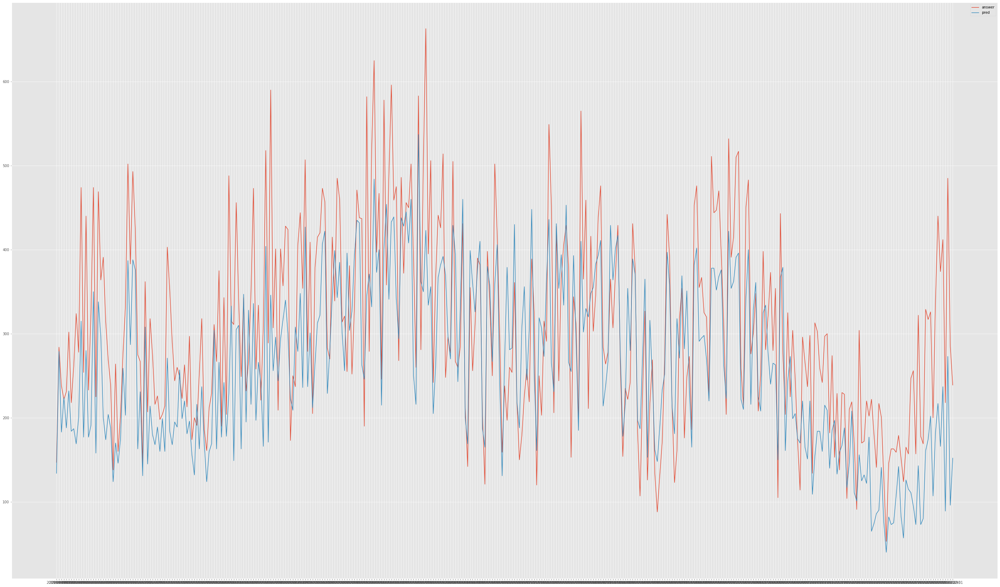

In [136]:
## 정답과 예측 그래프 형태 시각화
x = compare_1['datetime']
y = compare_1['answer']
x_1 = compare_1['datetime']
y_1 = compare_1['pred']
plt.figure(figsize=(50, 30))
plt.plot(x,y, label = 'answer')
plt.plot(x_1,y_1, label = 'pred')
plt.legend()
plt.show

In [151]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_squared_log_error

In [289]:
import numpy as np
## 절대 평균 오차
def MAE(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred)))

MAE(Answer, sub_1)

72.28767123287672

In [290]:
## 평균 절대 백분율 오차
## 실제값 대비 오차의 절대값들의 평균
def MAPE(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
MAPE(Answer, sub_1)

##25%벗어남 정답에서

24.692204237823063

In [291]:
##예측값과 실제값 차이의 면적의 합
def MSE(y_true, y_pred):
    return np.mean(np.square((y_true - y_pred)))

MSE(Answer, sub_1)

7818.6547945205475

In [292]:
def MPE(y_true, y_pred): 
    return np.mean((y_true - y_pred) / y_true) * 100
MPE(Answer, sub_1)

11.611046172922697

In [216]:
## test 변수 데이터와 Answer 예측된 데이터의 rmsle 스코어
k_fold = KFold(n_splits=10, shuffle=True, random_state=0)
%time score = cross_val_score(model, T_test,sub_1, cv=k_fold, scoring=rmsle_scorer)
score = score.mean()
# 0에 근접할수록 좋은 데이터
print("Score= {0:.5f}".format(score))

Wall time: 2.18 s
Score= 0.07389


In [953]:
## 트레인데이터로 적용시켜 만든 모델로 테스트 데이터와 실제 정답을 비교해서 정확도
print(model.score(T_test,Answer))
## 약 41%

0.41091576229601967


In [293]:
print("1. 개월별 평균 절대 백분율 오차")
print("1개월=",(MAPE(Answer[:31], sub_1[:31])))
print("2개월=",(MAPE(Answer[:59], sub_1[:59])))
print("3개월=",(MAPE(Answer[:90], sub_1[:90])))
print("4개월=",(MAPE(Answer[:120], sub_1[:120])))
print("5개월=",(MAPE(Answer[:151], sub_1[:151])))
print("6개월=",(MAPE(Answer[:181], sub_1[:181])))
print("7개월=",(MAPE(Answer[:212], sub_1[:212])))
print("8개월=",(MAPE(Answer[:243], sub_1[:243])))
print("9개월=",(MAPE(Answer[:273], sub_1[:273])))
print("10개월=",(MAPE(Answer[:304], sub_1[:304])))
print("11개월=",(MAPE(Answer[:334], sub_1[:334])))
print("12개월=",(MAPE(Answer[:365], sub_1[:365])))
print("2. 월별별 평균 절대 백분율 오차")
print("1월=",(MAPE(Answer[:31], sub_1[:31])))
print("2월=",(MAPE(Answer[31:59], sub_1[31:59])))
print("3월=",(MAPE(Answer[59:90], sub_1[59:90])))
print("4월=",(MAPE(Answer[90:120], sub_1[90:120])))
print("5월=",(MAPE(Answer[120:151], sub_1[120:151])))
print("6월=",(MAPE(Answer[151:181], sub_1[151:181])))
print("7월=",(MAPE(Answer[181:212], sub_1[181:212])))
print("8월=",(MAPE(Answer[212:243], sub_1[212:243])))
print("9월=",(MAPE(Answer[243:273], sub_1[243:273])))
print("10월=",(MAPE(Answer[273:304], sub_1[273:304])))
print("11월=",(MAPE(Answer[304:334], sub_1[304:334])))
print("12월=",(MAPE(Answer[334:365], sub_1[334:365])))
print("3. 월별 절대 평균 오차")
print("1월=",(MAE(Answer[:31], sub_1[:31])))
print("2월=",(MAE(Answer[31:59], sub_1[31:59])))
print("3월=",(MAE(Answer[59:90], sub_1[59:90])))
print("4월=",(MAE(Answer[90:120], sub_1[90:120])))
print("5월=",(MAE(Answer[120:151], sub_1[120:151])))
print("6월=",(MAE(Answer[151:181], sub_1[151:181])))
print("7월=",(MAE(Answer[181:212], sub_1[181:212])))
print("8월=",(MAE(Answer[212:243], sub_1[212:243])))
print("9월=",(MAE(Answer[243:273], sub_1[243:273])))
print("10월=",(MAE(Answer[273:304], sub_1[273:304])))
print("11월=",(MAE(Answer[304:334], sub_1[304:334])))
print("12월=",(MAE(Answer[334:365], sub_1[334:365])))

1. 개월별 평균 절대 백분율 오차
1개월= 24.662887342909485
2개월= 23.71568663398491
3개월= 24.083049201759593
4개월= 23.30471004219891
5개월= 22.831696368733585
6개월= 21.753326729173477
7개월= 22.420829785214284
8개월= 21.967489168699718
9개월= 22.08876513210939
10개월= 21.869314731295177
11개월= 22.70202941666659
12개월= 24.692204237823063
2. 월별별 평균 절대 백분율 오차
1월= 24.662887342909485
2월= 22.667000134818398
3월= 24.7822231210727
4월= 20.969692563516812
5월= 21.00067569725495
6월= 16.325532876720946
7월= 26.318186338226766
8월= 18.86722430737425
9월= 23.071100435727793
10월= 19.936735395092523
11월= 31.14020489509681
12월= 46.134732956089515
3. 월별 절대 평균 오차
1월= 79.29032258064517
2월= 62.892857142857146
3월= 84.12903225806451
4월= 75.2
5월= 92.16129032258064
6월= 53.0
7월= 66.38709677419355
8월= 51.54838709677419
9월= 56.333333333333336
10월= 61.96774193548387
11월= 70.83333333333333
12월= 111.70967741935483


# --------------------------------------------------------------------------------------------------------

## 2. 상관계수 0.1 이상인것만 테스트

In [954]:
feature_names = ["b1","b2","b3","f2","f3","x2","n2","p1","p2","p3","p4","p5","p6","up1","um1","uc1","s1","o1","ar1","ar2","ar3","ar4","ar5","ar6","ar7","ar8","ar9","ar10","ar11","ar12","ar22","ar23","art1","art2","art3","dayofweek"]

In [955]:
T_train = X_train[feature_names]
print(T_train.shape)
T_train.head()

(1461, 36)


,b1,b2,b3,f2,f3,x2,n2,p1,p2,p3,...,ar9,ar10,ar11,ar12,ar22,ar23,art1,art2,art3,dayofweek
0,-1.335521,3.980625,-0.272303,0.185103,0.636180,-0.851313,-0.241092,0.285035,0.340266,-0.422543,...,1.355081,-0.466771,0.212696,0.161905,-0.342492,-0.297406,-0.512666,-0.475674,0.722899,3
1,-1.037946,-0.090564,-1.091819,-0.861253,0.383197,0.407082,-1.225051,0.480704,0.379969,-0.140794,...,-0.456239,-0.466771,-0.504968,0.161905,-0.342492,-0.297406,-1.008842,-0.475674,-1.011062,4
2,-1.633096,0.723674,-1.091819,-0.992048,-0.713061,-0.149913,-1.272357,-0.528512,-0.557960,-1.317174,...,-0.456239,-0.824002,2.006853,-0.656586,-0.342492,-0.297406,-1.284496,-0.475674,-0.577572,5
3,-1.335521,0.316555,-1.050843,-0.551477,0.045887,-0.191172,-1.064212,-0.385462,-0.402088,-0.798410,...,-0.456239,-1.181232,-1.222631,-1.065831,-0.342492,-0.297406,-1.394757,-0.475674,-0.317478,6
4,-0.740372,1.130793,-2.198165,-1.563413,-0.207096,0.922817,-2.080339,1.216212,1.071977,0.939368,...,-0.456239,-1.181232,-1.222631,-1.884322,-0.342492,-0.297406,-1.284496,-0.475674,-2.571627,0


In [956]:
T_test = X_test[feature_names]

print(T_test.shape)
T_test.head()

(365, 36)


,b1,b2,b3,f2,f3,x2,n2,p1,p2,p3,...,ar9,ar10,ar11,ar12,ar22,ar23,art1,art2,art3,dayofweek
0,-0.312538,-0.535543,0.684917,0.989744,-1.423688,-0.462806,0.577113,-0.970666,-0.987793,-0.971490,...,-0.263422,-1.188202,0.301542,-0.704276,1.123828,-0.384814,0.788291,-0.089183,0.213605,1
1,0.263605,-0.030444,1.185909,1.244570,1.908394,0.386172,1.071577,-0.606641,-0.607788,-1.441581,...,-0.263422,1.281228,0.728142,-0.312415,-0.795972,-0.384814,1.138963,-0.089183,0.952230,2
2,0.263605,-0.030444,0.634818,0.177484,-1.423688,-1.021344,0.657607,-0.756877,-0.795835,-0.774129,...,-0.263422,-1.188202,-0.978258,-1.096137,-0.795972,-0.384814,1.138963,-0.089183,0.049466,3
3,-2.040969,-0.030444,0.083727,-0.252536,0.956371,-0.775588,-0.287624,-1.239850,-1.248335,-1.913734,...,-0.263422,-0.879523,1.581341,-0.704276,-0.156039,-0.384814,-0.526728,-0.089183,0.049466,4
4,-0.600610,-1.040641,-0.116669,-0.571069,-1.106347,-0.440465,-0.285324,-0.683875,-0.673364,-1.282450,...,-0.263422,0.355192,0.301542,0.471307,0.483895,-0.384814,-0.351392,-0.089183,-0.196742,5


In [957]:
## 정답컬럼 추출
label_name = "count"

Y_train = X_train[label_name]

print(Y_train.shape)
Y_train.head()

(1461,)


0    321
1    271
2    315
3    271
4    109
Name: count, dtype: int64

In [958]:
from sklearn.ensemble import RandomForestRegressor

max_depth_list = []

model = RandomForestRegressor(n_estimators=100,
                              n_jobs=-1,
                              random_state=0)
model

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

In [959]:
# 학습시킴, 피팅(옷을 맞출 때 사용하는 피팅을 생각함) - 피처와 레이블을 넣어주면 알아서 학습을 함
model.fit(T_train, Y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

In [960]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

k_fold = KFold(n_splits=10, shuffle=True, random_state=0)
%time score = cross_val_score(model, T_train,Y_train, cv=k_fold, scoring=rmsle_scorer)
score = score.mean()
# 0에 근접할수록 좋은 데이터
print("Score= {0:.5f}".format(score))

Wall time: 4.48 s
Score= 0.26307


In [961]:
## Test 데이터 예측 진행
pred = model.predict(T_test)
pred = np.round(pred,0).astype(int)
print(pred.shape)
pred[0:10]

(365,)


array([133, 285, 184, 221, 190, 243, 184, 185, 170, 205])

In [962]:
submission = pd.read_csv("sampleSubmission.csv")
submission

submission["count"] = pred

print(submission.shape)
submission.head()

(365, 2)


,datetime,count
0,2019-01-01,133
1,2019-01-02,285
2,2019-01-03,184
3,2019-01-04,221
4,2019-01-05,190


In [182]:
submission.to_csv(f"submission_4(timeadd).csv", index=False)

In [294]:
sub_2 = pd.read_csv("submission_4(timeadd).csv", parse_dates=["datetime"])

### 2.1 count와 상관관계가 양의 값을 가지는 변수들을 전부다 단순히 사용했을때 예측값

<function matplotlib.pyplot.show(*args, **kw)>

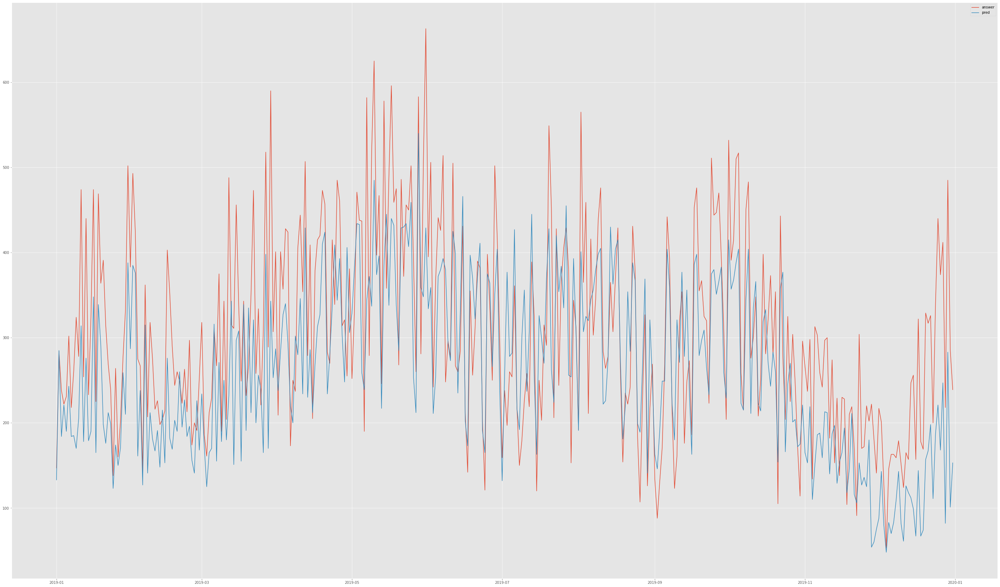

In [199]:
## 정답과 예측 그래프 형태 시각화
x = OriginAnswer['datetime']
y = OriginAnswer['dep_count']
x_1 = sub_2['datetime']
y_1 = sub_2['count']
plt.figure(figsize=(50, 30))
plt.plot(x,y, label = 'answer')
plt.plot(x_1,y_1, label = 'pred')
plt.legend()
plt.show

In [295]:
sub_2 = sub_2['count']
sub_2

0      133
1      285
2      184
3      221
4      190
      ... 
360    247
361     82
362    283
363    101
364    153
Name: count, Length: 365, dtype: int64

In [296]:
Answer

0      147
1      284
2      238
3      222
4      231
      ... 
360    412
361    218
362    485
363    285
364    239
Name: dep_count, Length: 365, dtype: int64

In [204]:
import numpy as np
## 절대 평균 오차
def MAE(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred)))

MAE(Answer, sub_2)

72.61643835616438

In [205]:
## 평균 절대 백분율 오차
## 실제값 대비 오차의 절대값들의 평균
def MAPE(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
MAPE(Answer, sub_2)

##25%벗어남 정답에서

24.7439409812062

In [206]:
##예측값과 실제값 차이의 면적의 합
def MSE(y_true, y_pred):
    return np.mean(np.square((y_true - y_pred)))

MSE(Answer, sub_2)

7928.906849315069

In [207]:
def MPE(y_true, y_pred): 
    return np.mean((y_true - y_pred) / y_true) * 100
MPE(Answer, sub_2)

11.45719806908388

In [211]:
## test 변수 데이터와 sub_2 예측된 데이터의 rmsle 스코어
k_fold = KFold(n_splits=10, shuffle=True, random_state=0)
%time score = cross_val_score(model, T_test,sub_2, cv=k_fold, scoring=rmsle_scorer)
score = score.mean()
# 0에 근접할수록 좋은 데이터
print("Score= {0:.5f}".format(score))

Wall time: 2.22 s
Score= 0.07233


In [963]:
## 트레인데이터로 적용시켜 만든 모델로 테스트 데이터와 실제 정답을 비교해서 정확도
print(model.score(T_test,Answer))
## 약 40%

0.4027999964803829


In [297]:
print("1. 개월별 평균 절대 백분율 오차")
print("1개월=",(MAPE(Answer[:31], sub_2[:31])))
print("2개월=",(MAPE(Answer[:59], sub_2[:59])))
print("3개월=",(MAPE(Answer[:90], sub_2[:90])))
print("4개월=",(MAPE(Answer[:120], sub_2[:120])))
print("5개월=",(MAPE(Answer[:151], sub_2[:151])))
print("6개월=",(MAPE(Answer[:181], sub_2[:181])))
print("7개월=",(MAPE(Answer[:212], sub_2[:212])))
print("8개월=",(MAPE(Answer[:243], sub_2[:243])))
print("9개월=",(MAPE(Answer[:273], sub_2[:273])))
print("10개월=",(MAPE(Answer[:304], sub_2[:304])))
print("11개월=",(MAPE(Answer[:334], sub_2[:334])))
print("12개월=",(MAPE(Answer[:365], sub_2[:365])))
print("2. 월별별 평균 절대 백분율 오차")
print("1월=",(MAPE(Answer[:31], sub_2[:31])))
print("2월=",(MAPE(Answer[31:59], sub_2[31:59])))
print("3월=",(MAPE(Answer[59:90], sub_2[59:90])))
print("4월=",(MAPE(Answer[90:120], sub_2[90:120])))
print("5월=",(MAPE(Answer[120:151], sub_2[120:151])))
print("6월=",(MAPE(Answer[151:181], sub_2[151:181])))
print("7월=",(MAPE(Answer[181:212], sub_2[181:212])))
print("8월=",(MAPE(Answer[212:243], sub_2[212:243])))
print("9월=",(MAPE(Answer[243:273], sub_2[243:273])))
print("10월=",(MAPE(Answer[273:304], sub_2[273:304])))
print("11월=",(MAPE(Answer[304:334], sub_2[304:334])))
print("12월=",(MAPE(Answer[334:365], sub_2[334:365])))
print("3. 월별 절대 평균 오차")
print("1월=",(MAE(Answer[:31], sub_2[:31])))
print("2월=",(MAE(Answer[31:59], sub_2[31:59])))
print("3월=",(MAE(Answer[59:90], sub_2[59:90])))
print("4월=",(MAE(Answer[90:120], sub_2[90:120])))
print("5월=",(MAE(Answer[120:151], sub_2[120:151])))
print("6월=",(MAE(Answer[151:181], sub_2[151:181])))
print("7월=",(MAE(Answer[181:212], sub_2[181:212])))
print("8월=",(MAE(Answer[212:243], sub_2[212:243])))
print("9월=",(MAE(Answer[243:273], sub_2[243:273])))
print("10월=",(MAE(Answer[273:304], sub_2[273:304])))
print("11월=",(MAE(Answer[304:334], sub_2[304:334])))
print("12월=",(MAE(Answer[334:365], sub_2[334:365])))

1. 개월별 평균 절대 백분율 오차
1개월= 24.006514875244452
2개월= 23.483574234286507
3개월= 24.094506956447255
4개월= 23.37078384802776
5개월= 22.85886985444539
6개월= 21.8782286047463
7개월= 22.49063830635963
8개월= 22.012735589505684
9개월= 22.213569057006506
10개월= 21.973477777737536
11개월= 22.82824317199232
12개월= 24.7439409812062
2. 월별별 평균 절대 백분율 오차
1월= 24.006514875244452
2월= 22.904604238940202
3월= 25.257249879269356
4월= 21.19961452276927
5월= 20.877267298642643
6월= 16.942334314594174
7월= 26.0663207577148
8월= 18.74449765489158
9월= 23.840320143763176
10월= 19.859125544175253
11월= 31.48986583377418
12월= 45.3840399578977
3. 월별 절대 평균 오차
1월= 77.6774193548387
2월= 63.035714285714285
3월= 86.12903225806451
4월= 76.06666666666666
5월= 92.29032258064517
6월= 54.96666666666667
7월= 66.03225806451613
8월= 51.83870967741935
9월= 57.93333333333333
10월= 61.61290322580645
11월= 71.26666666666667
12월= 110.64516129032258


### ---------------------------------------------------------------------------------------------------------------------------------------------------

## 3. 피쳐 임포턴스 TOP 20만 돌려보기

In [964]:
feature_names = ["um1","p1","n2","month","f1","f3","b3","f2","p2","s2","ar10","dayofweek","week","ar2","art2","p3","o2","p5","ar20","uc1","p4"]

In [965]:
T_train = X_train[feature_names]
print(T_train.shape)
T_train.head()

(1461, 21)


,um1,p1,n2,month,f1,f3,b3,f2,p2,s2,...,dayofweek,week,ar2,art2,p3,o2,p5,ar20,uc1,p4
0,-0.058914,0.285035,-0.241092,1,-0.180422,0.636180,-0.272303,0.185103,0.340266,-0.042762,...,3,1,-0.252816,-0.475674,-0.422543,-2.421050,0.096568,-0.21933,0.148462,0.104192
1,-1.115024,0.480704,-1.225051,1,-0.180422,0.383197,-1.091819,-0.861253,0.379969,-0.042762,...,4,1,-0.827128,-0.475674,-0.140794,0.026807,-0.817217,-0.21933,-0.215470,-0.750917
2,-1.115024,-0.528512,-1.272357,1,-0.180422,-0.713061,-1.091819,-0.992048,-0.557960,-0.042762,...,5,1,-0.663039,-0.475674,-1.317174,0.026807,-1.178269,-0.21933,-0.943334,-1.152761
3,-1.115024,-0.385462,-1.064212,1,0.913342,0.045887,-1.050843,-0.551477,-0.402088,-0.042762,...,6,1,-0.580995,-0.475674,-0.798410,-2.421050,-1.089591,-0.21933,0.330428,-1.066733
4,-1.907107,1.216212,-2.080339,1,-0.180422,-0.207096,-2.198165,-1.563413,1.071977,-0.042762,...,0,2,-1.073262,-0.475674,0.939368,-2.421050,-1.363894,-0.21933,-1.307266,-1.297197


In [966]:
T_test = X_test[feature_names]

print(T_test.shape)
T_test.head()

(365, 21)


,um1,p1,n2,month,f1,f3,b3,f2,p2,s2,...,dayofweek,week,ar2,art2,p3,o2,p5,ar20,uc1,p4
0,0.679018,-0.970666,0.577113,1,0.932320,-1.423688,0.684917,0.989744,-0.987793,-0.070398,...,1,1,0.628721,-0.089183,-0.971490,-1.413037,-0.102170,0.0,-1.188779,-0.093474
1,0.982683,-0.606641,1.071577,1,0.932320,1.908394,1.185909,1.244570,-0.607788,-0.070398,...,2,1,1.757790,-0.089183,-1.441581,0.347231,0.557934,0.0,0.528294,0.557920
2,0.729629,-0.756877,0.657607,1,-0.034432,-1.423688,0.634818,0.177484,-0.795835,-0.070398,...,3,1,1.475522,-0.089183,-0.774129,-1.413037,0.069271,0.0,-0.845364,0.090223
3,-0.231978,-1.239850,-0.287624,1,-0.034432,0.956371,0.083727,-0.252536,-1.248335,-0.070398,...,4,1,-0.218080,-0.089183,-1.913734,-1.413037,-0.773802,0.0,-0.330242,-0.770328
4,-0.181367,-0.683875,-0.285324,1,-0.034432,-1.106347,-0.116669,-0.571069,-0.673364,-0.070398,...,5,1,0.064187,-0.089183,-1.282450,-1.413037,-0.555273,0.0,-0.845364,-0.559980


In [967]:
## 정답컬럼 추출
label_name = "count"

Y_train = X_train[label_name]

print(Y_train.shape)
Y_train.head()

(1461,)


0    321
1    271
2    315
3    271
4    109
Name: count, dtype: int64

In [968]:
from sklearn.ensemble import RandomForestRegressor

max_depth_list = []

model = RandomForestRegressor(n_estimators=100,
                              n_jobs=-1,
                              random_state=0)
model

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

In [969]:
# 학습시킴, 피팅(옷을 맞출 때 사용하는 피팅을 생각함) - 피처와 레이블을 넣어주면 알아서 학습을 함
model.fit(T_train, Y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

In [970]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

k_fold = KFold(n_splits=10, shuffle=True, random_state=0)
%time score = cross_val_score(model, T_train,Y_train, cv=k_fold, scoring=rmsle_scorer)
score = score.mean()
# 0에 근접할수록 좋은 데이터
print("Score= {0:.5f}".format(score))

Wall time: 2.68 s
Score= 0.26429


In [971]:
## Test 데이터 예측 진행
pred = model.predict(T_test)
pred = np.round(pred,0).astype(int)
print(pred.shape)
pred[0:10]

(365,)


array([141, 258, 214, 211, 225, 238, 196, 206, 187, 204])

In [972]:
submission = pd.read_csv("sampleSubmission.csv")
submission

submission["count"] = pred

print(submission.shape)
submission.head()

(365, 2)


,datetime,count
0,2019-01-01,141
1,2019-01-02,258
2,2019-01-03,214
3,2019-01-04,211
4,2019-01-05,225


In [231]:
submission.to_csv(f"submission_5_NEW.csv", index=False)

In [298]:
sub_3 = pd.read_csv("submission_5_NEW.csv", parse_dates=["datetime"])

<function matplotlib.pyplot.show(*args, **kw)>

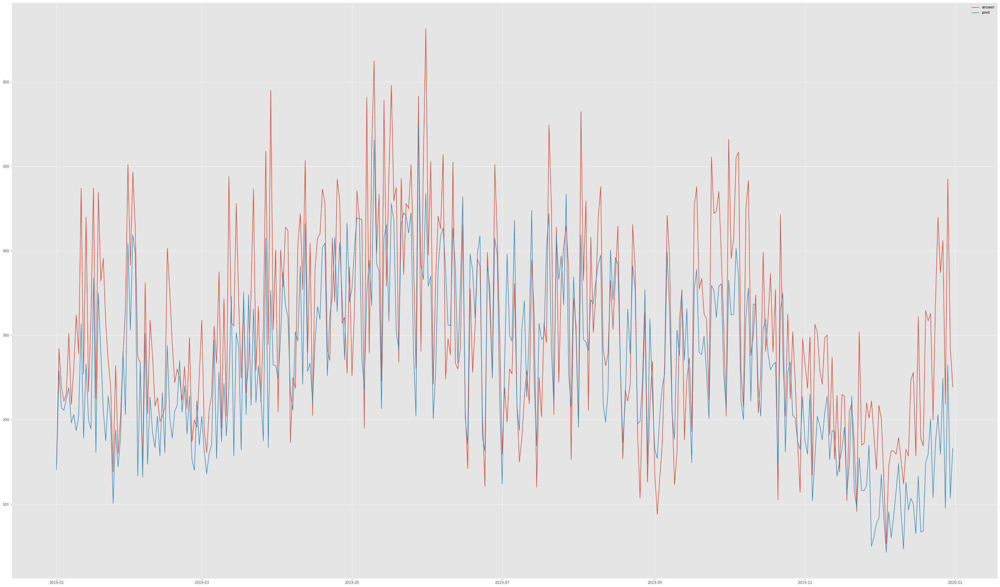

In [248]:
## 정답과 예측 그래프 형태 시각화
x = OriginAnswer['datetime']
y = OriginAnswer['dep_count']
x_1 = sub_3['datetime']
y_1 = sub_3['count']
plt.figure(figsize=(50, 30))
plt.plot(x,y, label = 'answer')
plt.plot(x_1,y_1, label = 'pred')
plt.legend()
plt.show

In [299]:
Answer

0      147
1      284
2      238
3      222
4      231
      ... 
360    412
361    218
362    485
363    285
364    239
Name: dep_count, Length: 365, dtype: int64

In [300]:
sub_3 = sub_3['count']
sub_3

0      141
1      258
2      214
3      211
4      225
      ... 
360    249
361     95
362    265
363    107
364    166
Name: count, Length: 365, dtype: int64

In [253]:
import numpy as np
## 절대 평균 오차
def MAE(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred)))

MAE(Answer, sub_3)

71.78904109589041

In [254]:
## 평균 절대 백분율 오차
## 실제값 대비 오차의 절대값들의 평균
def MAPE(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
MAPE(Answer, sub_3)

##25%벗어남 정답에서

24.487826979971633

In [255]:
##예측값과 실제값 차이의 면적의 합
def MSE(y_true, y_pred):
    return np.mean(np.square((y_true - y_pred)))

MSE(Answer, sub_3)

7770.397260273972

In [256]:
def MPE(y_true, y_pred): 
    return np.mean((y_true - y_pred) / y_true) * 100
MPE(Answer, sub_3)

11.396258617964934

In [257]:
## test 변수 데이터와 sub_2 예측된 데이터의 rmsle 스코어
k_fold = KFold(n_splits=10, shuffle=True, random_state=0)
%time score = cross_val_score(model, T_test,sub_3, cv=k_fold, scoring=rmsle_scorer)
score = score.mean()
# 0에 근접할수록 좋은 데이터
print("Score= {0:.5f}".format(score))

Wall time: 2.15 s
Score= 0.09333


In [973]:
## 트레인데이터로 적용시켜 만든 모델로 테스트 데이터와 실제 정답을 비교해서 정확도
print(model.score(T_test,Answer))
## 약 41%

0.41462172826275256


In [301]:
print("1. 개월별 평균 절대 백분율 오차")
print("1개월=",(MAPE(Answer[:31], sub_3[:31])))
print("2개월=",(MAPE(Answer[:59], sub_3[:59])))
print("3개월=",(MAPE(Answer[:90], sub_3[:90])))
print("4개월=",(MAPE(Answer[:120], sub_3[:120])))
print("5개월=",(MAPE(Answer[:151], sub_3[:151])))
print("6개월=",(MAPE(Answer[:181], sub_3[:181])))
print("7개월=",(MAPE(Answer[:212], sub_3[:212])))
print("8개월=",(MAPE(Answer[:243], sub_3[:243])))
print("9개월=",(MAPE(Answer[:273], sub_3[:273])))
print("10개월=",(MAPE(Answer[:304], sub_3[:304])))
print("11개월=",(MAPE(Answer[:334], sub_3[:334])))
print("12개월=",(MAPE(Answer[:365], sub_3[:365])))
print("2. 월별별 평균 절대 백분율 오차")
print("1월=",(MAPE(Answer[:31], sub_3[:31])))
print("2월=",(MAPE(Answer[31:59], sub_3[31:59])))
print("3월=",(MAPE(Answer[59:90], sub_3[59:90])))
print("4월=",(MAPE(Answer[90:120], sub_3[90:120])))
print("5월=",(MAPE(Answer[120:151], sub_3[120:151])))
print("6월=",(MAPE(Answer[151:181], sub_3[151:181])))
print("7월=",(MAPE(Answer[181:212], sub_3[181:212])))
print("8월=",(MAPE(Answer[212:243], sub_3[212:243])))
print("9월=",(MAPE(Answer[243:273], sub_3[243:273])))
print("10월=",(MAPE(Answer[273:304], sub_3[273:304])))
print("11월=",(MAPE(Answer[304:334], sub_3[304:334])))
print("12월=",(MAPE(Answer[334:365], sub_3[334:365])))
print("3. 월별 절대 평균 오차")
print("1월=",(MAE(Answer[:31], sub_3[:31])))
print("2월=",(MAE(Answer[31:59], sub_3[31:59])))
print("3월=",(MAE(Answer[59:90], sub_3[59:90])))
print("4월=",(MAE(Answer[90:120], sub_3[90:120])))
print("5월=",(MAE(Answer[120:151], sub_3[120:151])))
print("6월=",(MAE(Answer[151:181], sub_3[151:181])))
print("7월=",(MAE(Answer[181:212], sub_3[181:212])))
print("8월=",(MAE(Answer[212:243], sub_3[212:243])))
print("9월=",(MAE(Answer[243:273], sub_3[243:273])))
print("10월=",(MAE(Answer[273:304], sub_3[273:304])))
print("11월=",(MAE(Answer[304:334], sub_3[304:334])))
print("12월=",(MAE(Answer[334:365], sub_3[334:365])))

1. 개월별 평균 절대 백분율 오차
1개월= 22.1913028081524
2개월= 21.349177403387703
3개월= 22.679084137231552
4개월= 22.2076460971297
5개월= 21.974034139425523
6개월= 21.001996607259702
7개월= 21.76676798777074
8개월= 21.31529647075544
9개월= 21.747023971405508
10개월= 21.644946978068692
11개월= 22.426832155404753
12개월= 24.487826979971633
2. 월별별 평균 절대 백분율 오차
1월= 22.1913028081524
2월= 20.416824276683926
3월= 25.21019695325694
4월= 20.79333197682415
5월= 21.06972978702225
6월= 16.109407695358392
7월= 26.232046048173903
8월= 18.227813838263746
9월= 25.24401672667109
10월= 20.746010875457316
11월= 30.34993528574367
12월= 46.69338412207935
3. 월별 절대 평균 오차
1월= 71.87096774193549
2월= 55.57142857142857
3월= 86.09677419354838
4월= 72.96666666666667
5월= 90.35483870967742
6월= 50.233333333333334
7월= 66.58064516129032
8월= 51.16129032258065
9월= 64.0
10월= 67.6774193548387
11월= 68.76666666666667
12월= 113.61290322580645


## -----------------------------------------------------------------------------------------------------------------

## 4. 피쳐 임포턴스와 상관계수 높은것만 돌려보기

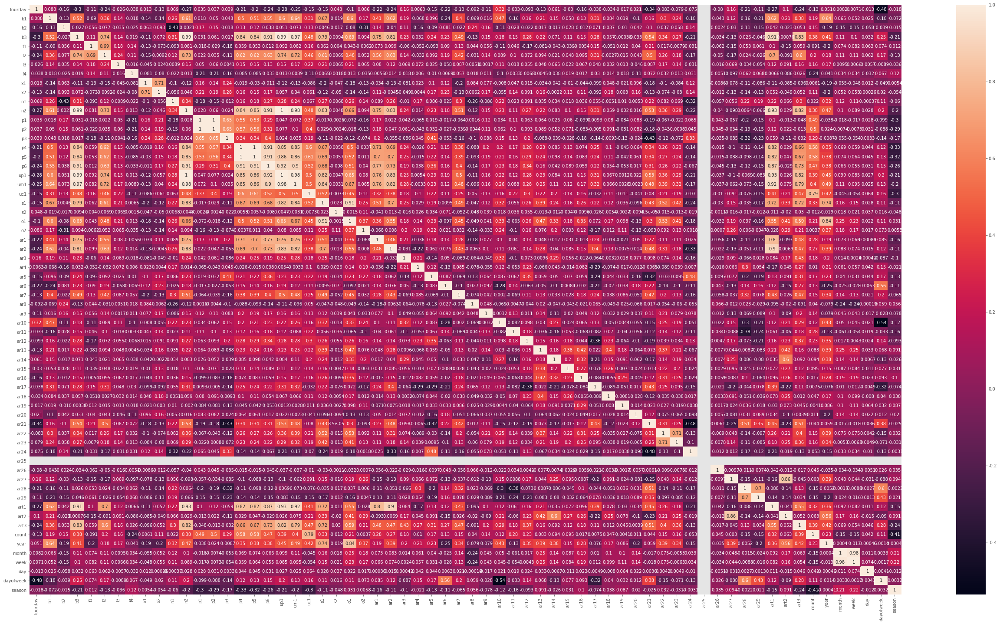

In [230]:
## 상관관계도를 시각화
transformed_corr_x = X_train.corr()
plt.figure(figsize=(45,25))
sns.heatmap(transformed_corr_x, annot=True)

In [974]:
feature_names = ["um1","p1","b3","f2","ar10","f3","p2","day","art2","o2","uc1","p5","p3","ar9","ar1","ar5","ar2","ar11","p4",
                "year","day","dayofweek"]

In [975]:
T_train = X_train[feature_names]
print(T_train.shape)
T_train.head()

(1461, 22)


,um1,p1,b3,f2,ar10,f3,p2,day,art2,o2,...,p3,ar9,ar1,ar5,ar2,ar11,p4,year,day,dayofweek
0,-0.058914,0.285035,-0.272303,0.185103,-0.466771,0.636180,0.340266,1,-0.475674,-2.421050,...,-0.422543,1.355081,-0.695981,-1.477119,-0.252816,0.212696,0.104192,2015,1,3
1,-1.115024,0.480704,-1.091819,-0.861253,-0.466771,0.383197,0.379969,2,-0.475674,0.026807,...,-0.140794,-0.456239,-0.919854,-0.813370,-0.827128,-0.504968,-0.750917,2015,2,4
2,-1.115024,-0.528512,-1.091819,-0.992048,-0.824002,-0.713061,-0.557960,3,-0.475674,0.026807,...,-1.317174,-0.456239,-1.703407,-0.592120,-0.663039,2.006853,-1.152761,2015,3,5
3,-1.115024,-0.385462,-1.050843,-0.551477,-1.181232,0.045887,-0.402088,4,-0.475674,-2.421050,...,-0.798410,-0.456239,-2.039216,-1.477119,-0.580995,-1.222631,-1.066733,2015,4,6
4,-1.907107,1.216212,-2.198165,-1.563413,-1.181232,-0.207096,1.071977,5,-0.475674,-2.421050,...,0.939368,-0.456239,-1.143726,-1.698369,-1.073262,-1.222631,-1.297197,2015,5,0


In [976]:
T_test = X_test[feature_names]

print(T_test.shape)
T_test.head()

(365, 22)


,um1,p1,b3,f2,ar10,f3,p2,day,art2,o2,...,p3,ar9,ar1,ar5,ar2,ar11,p4,year,day,dayofweek
0,0.679018,-0.970666,0.684917,0.989744,-1.188202,-1.423688,-0.987793,1,-0.089183,-1.413037,...,-0.971490,-0.263422,0.719315,-0.189182,0.628721,0.301542,-0.093474,2019,1,1
1,0.982683,-0.606641,1.185909,1.244570,1.281228,1.908394,-0.607788,2,-0.089183,0.347231,...,-1.441581,-0.263422,0.085136,0.739763,1.757790,0.728142,0.557920,2019,2,2
2,0.729629,-0.756877,0.634818,0.177484,-1.188202,-1.423688,-0.795835,3,-0.089183,-1.413037,...,-0.774129,-0.263422,0.402226,0.120466,1.475522,-0.978258,0.090223,2019,3,3
3,-0.231978,-1.239850,0.083727,-0.252536,-0.879523,0.956371,-1.248335,4,-0.089183,-1.413037,...,-1.913734,-0.263422,-0.707587,1.049411,-0.218080,1.581341,-0.770328,2019,4,4
4,-0.181367,-0.683875,-0.116669,-0.571069,0.355192,-1.106347,-0.673364,5,-0.089183,-1.413037,...,-1.282450,-0.263422,-0.707587,-0.808479,0.064187,0.301542,-0.559980,2019,5,5


In [977]:
## 정답컬럼 추출
label_name = "count"

Y_train = X_train[label_name]

print(Y_train.shape)
Y_train.head()

(1461,)


0    321
1    271
2    315
3    271
4    109
Name: count, dtype: int64

In [978]:
from sklearn.ensemble import RandomForestRegressor

max_depth_list = []

model = RandomForestRegressor(n_estimators=100,
                              n_jobs=-1,
                              random_state=0)
model

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

In [979]:
# 학습시킴, 피팅(옷을 맞출 때 사용하는 피팅을 생각함) - 피처와 레이블을 넣어주면 알아서 학습을 함
model.fit(T_train, Y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

In [980]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

k_fold = KFold(n_splits=10, shuffle=True, random_state=0)
%time score = cross_val_score(model, T_train,Y_train, cv=k_fold, scoring=rmsle_scorer)
score = score.mean()
# 0에 근접할수록 좋은 데이터
print("Score= {0:.5f}".format(score))

Wall time: 2.72 s
Score= 0.26653


In [981]:
## Test 데이터 예측 진행
pred = model.predict(T_test)
pred = np.round(pred,0).astype(int)
print(pred.shape)
pred[0:10]

(365,)


array([133, 271, 194, 221, 200, 231, 178, 185, 175, 203])

In [982]:
submission = pd.read_csv("sampleSubmission.csv")
submission

submission["count"] = pred

print(submission.shape)
submission.head()

(365, 2)


,datetime,count
0,2019-01-01,133
1,2019-01-02,271
2,2019-01-03,194
3,2019-01-04,221
4,2019-01-05,200


In [243]:
submission.to_csv(f"submission_6_NEW.csv", index=False)

In [302]:
sub_4 = pd.read_csv("submission_6_NEW.csv", parse_dates=["datetime"])

<function matplotlib.pyplot.show(*args, **kw)>

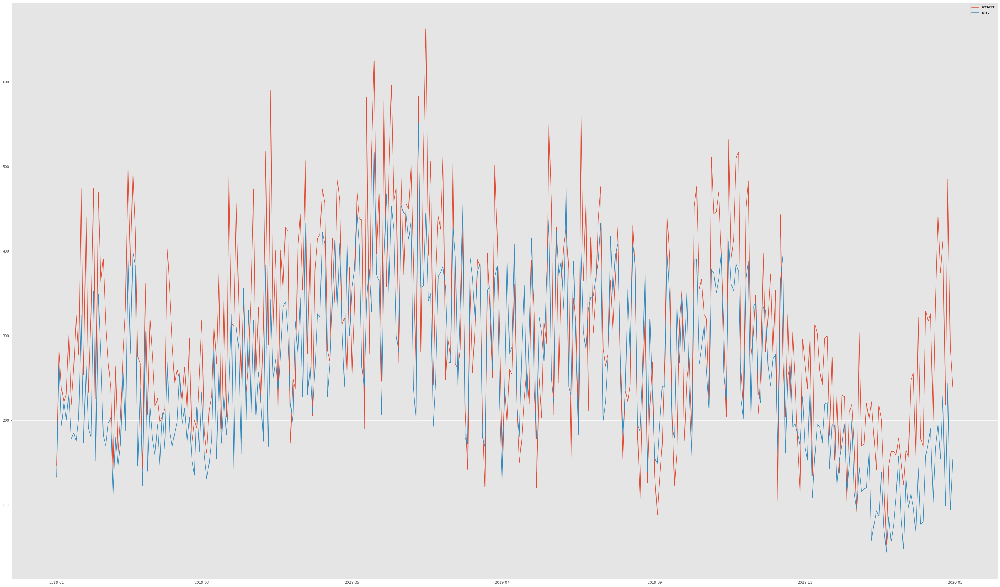

In [245]:
## 정답과 예측 그래프 형태 시각화
x = OriginAnswer['datetime']
y = OriginAnswer['dep_count']
x_1 = sub_4['datetime']
y_1 = sub_4['count']
plt.figure(figsize=(50, 30))
plt.plot(x,y, label = 'answer')
plt.plot(x_1,y_1, label = 'pred')
plt.legend()
plt.show

In [304]:
sub_4 = sub_4['count']
sub_4

0      133
1      271
2      194
3      221
4      200
      ... 
360    229
361     99
362    244
363     94
364    154
Name: count, Length: 365, dtype: int64

In [259]:
import numpy as np
## 절대 평균 오차
def MAE(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred)))

MAE(Answer, sub_4)

74.12602739726027

In [260]:
## 평균 절대 백분율 오차
## 실제값 대비 오차의 절대값들의 평균
def MAPE(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
MAPE(Answer, sub_4)

##25%벗어남 정답에서

25.28818086394934

In [261]:
##예측값과 실제값 차이의 면적의 합
def MSE(y_true, y_pred):
    return np.mean(np.square((y_true - y_pred)))

MSE(Answer, sub_4)

8301.035616438356

In [1071]:
## RMSE란?( Root Mean Squared Error )
## 표준편차와 동일하다. 특정 수치에 대한 예측의 정확도를 표현할 때,
## Accuracy로 판단하기에는 정확도를 올바르게 표기할 수 없어, 
## RMSE 수치로 정확도 판단을 하곤 한다. 일반적으로 해당 수치가 낮을수록 정확도가 높다고 판단한다.
RMSE = MSE(Answer, sub_6)**0.5
RMSE

87.93643407800981

In [263]:
def MPE(y_true, y_pred): 
    return np.mean((y_true - y_pred) / y_true) * 100
MPE(Answer, sub_4)

12.460928571697403

In [264]:
## test 변수 데이터와 sub_2 예측된 데이터의 rmsle 스코어
k_fold = KFold(n_splits=10, shuffle=True, random_state=0)
%time score = cross_val_score(model, T_test,sub_4, cv=k_fold, scoring=rmsle_scorer)
score = score.mean()
# 0에 근접할수록 좋은 데이터
print("Score= {0:.5f}".format(score))

Wall time: 2.66 s
Score= 0.08763


In [984]:
## 트레인데이터로 적용시켜 만든 모델로 테스트 데이터와 실제 정답을 비교해서 정확도
print(model.score(T_test,Answer))
## 약 37%

0.37488671004804164


In [305]:
print("1. 개월별 평균 절대 백분율 오차")
print("1개월=",(MAPE(Answer[:31], sub_4[:31])))
print("2개월=",(MAPE(Answer[:59], sub_4[:59])))
print("3개월=",(MAPE(Answer[:90], sub_4[:90])))
print("4개월=",(MAPE(Answer[:120], sub_4[:120])))
print("5개월=",(MAPE(Answer[:151], sub_4[:151])))
print("6개월=",(MAPE(Answer[:181], sub_4[:181])))
print("7개월=",(MAPE(Answer[:212], sub_4[:212])))
print("8개월=",(MAPE(Answer[:243], sub_4[:243])))
print("9개월=",(MAPE(Answer[:273], sub_4[:273])))
print("10개월=",(MAPE(Answer[:304], sub_4[:304])))
print("11개월=",(MAPE(Answer[:334], sub_4[:334])))
print("12개월=",(MAPE(Answer[:365], sub_4[:365])))
print("2. 월별별 평균 절대 백분율 오차")
print("1월=",(MAPE(Answer[:31], sub_4[:31])))
print("2월=",(MAPE(Answer[31:59], sub_4[31:59])))
print("3월=",(MAPE(Answer[59:90], sub_4[59:90])))
print("4월=",(MAPE(Answer[90:120], sub_4[90:120])))
print("5월=",(MAPE(Answer[120:151], sub_4[120:151])))
print("6월=",(MAPE(Answer[151:181], sub_4[151:181])))
print("7월=",(MAPE(Answer[181:212], sub_4[181:212])))
print("8월=",(MAPE(Answer[212:243], sub_4[212:243])))
print("9월=",(MAPE(Answer[243:273], sub_4[243:273])))
print("10월=",(MAPE(Answer[273:304], sub_4[273:304])))
print("11월=",(MAPE(Answer[304:334], sub_4[304:334])))
print("12월=",(MAPE(Answer[334:365], sub_4[334:365])))
print("3. 월별 절대 평균 오차")
print("1월=",(MAE(Answer[:31], sub_4[:31])))
print("2월=",(MAE(Answer[31:59], sub_4[31:59])))
print("3월=",(MAE(Answer[59:90], sub_4[59:90])))
print("4월=",(MAE(Answer[90:120], sub_4[90:120])))
print("5월=",(MAE(Answer[120:151], sub_4[120:151])))
print("6월=",(MAE(Answer[151:181], sub_4[151:181])))
print("7월=",(MAE(Answer[181:212], sub_4[181:212])))
print("8월=",(MAE(Answer[212:243], sub_4[212:243])))
print("9월=",(MAE(Answer[243:273], sub_4[243:273])))
print("10월=",(MAE(Answer[273:304], sub_4[273:304])))
print("11월=",(MAE(Answer[304:334], sub_4[304:334])))
print("12월=",(MAE(Answer[334:365], sub_4[334:365])))

1. 개월별 평균 절대 백분율 오차
1개월= 25.099413029128797
2개월= 24.27962625450225
3개월= 24.798395752639745
4개월= 24.017601398735707
5개월= 23.581358337374503
6개월= 22.61159523709467
7개월= 23.153743001554886
8개월= 22.55734529211714
9개월= 22.78062752322936
10개월= 22.569569932651675
11개월= 23.273207113771416
12개월= 25.28818086394934
2. 월별별 평균 절대 백분율 오차
1월= 25.099413029128797
2월= 23.372005182594304
3월= 25.785731249094972
4월= 21.67521833702355
5월= 21.892675519202125
6월= 17.730454299019474
7월= 26.319186400500023
8월= 18.47875450499454
9월= 24.589213595238313
10월= 20.71090147369342
11월= 30.403397215784906
12월= 46.99789804328563
3. 월별 절대 평균 오차
1월= 80.48387096774194
2월= 63.92857142857143
3월= 88.19354838709677
4월= 77.53333333333333
5월= 94.74193548387096
6월= 56.766666666666666
7월= 67.09677419354838
8월= 51.064516129032256
9월= 59.86666666666667
10월= 63.516129032258064
11월= 69.13333333333334
12월= 115.12903225806451


## -------------------------------------------------------------------------------------------------------------

## 5. 다중공선성문제를 최소화한 변수 + 양의 상관계수를 가지는 변수
    - inf 무한값을 가지는 다중공선성 문제를 일으키는 변수가 없어질때까지 하나씩 제거

In [30]:
from patsy import dmatrices
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [986]:
X_train.columns

Index(['datetime', 'tourday', 'b1', 'b2', 'b3', 'f1', 'f2', 'f3', 'f4', 'x1',
       'x2', 'n1', 'n2', 'p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'up1', 'um1',
       'uc1', 's1', 's2', 'o1', 'o2', 'ar1', 'ar2', 'ar3', 'ar4', 'ar5', 'ar6',
       'ar7', 'ar8', 'ar9', 'ar10', 'ar11', 'ar12', 'ar13', 'ar14', 'ar15',
       'ar16', 'ar17', 'ar18', 'ar19', 'ar20', 'ar21', 'ar22', 'ar23', 'ar24',
       'ar25', 'ar26', 'ar27', 'ar28', 'ar29', 'art1', 'art2', 'art3', 'count',
       'year', 'month', 'week', 'day', 'dayofweek', 'season'],
      dtype='object')

In [272]:
feature_names = "b1+b2+b3+f2+f3+x1+x2+n1+n2+p1+p2+p3+p4+p5+p6+up1+um1+uc1+s1+o1+o2+ar1+ar2+ar3+ar4+ar5+ar6+ar7+ar8+ar9+ar10+ar11+ar12+ar13+ar14+ar15+ar16+ar17+ar18+ar20+ar21+ar22+ar23+ar26+ar27+art1+art2+art3+year+day+dayofweek"

In [273]:
y, X = dmatrices("count ~" + feature_names, data=X_train, return_type="dataframe")

vif = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

result = sm.OLS(y, X).fit()

In [274]:
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                  count   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     120.6
Date:                Mon, 06 Jul 2020   Prob (F-statistic):               0.00
Time:                        14:17:17   Log-Likelihood:                -7821.6
No. Observations:                1461   AIC:                         1.574e+04
Df Residuals:                    1413   BIC:                         1.599e+04
Df Model:                          47                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -8814.1914   7781.119     -1.133      0.2

In [275]:
vif = pd.DataFrame()

In [276]:
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

In [277]:
vif["feature_names"] = X.columns

In [278]:
vif.round(1).iloc[5:]

,VIF Factor,feature_names
5,1.1,f3
6,2.4,x1
7,3.2,x2
8,2.9,n1
9,960.3,n2
10,4085.3,p1
11,4137.8,p2
12,28.9,p3
13,18898.3,p4
14,19588.5,p5


## verygood Step2에서 다중공선성을 가지는 변수들을 참고하여 하나씩 제거

In [323]:
feature_names = "f2+f3+x1+x2+n1+p2+p3+um1+uc1+s1+o1+o2+ar1+ar2+ar3+ar4+ar5+ar6+ar7+ar8+ar9+ar10+ar11+ar12+ar13+ar14+ar15+ar16+ar17+ar18+ar20+ar21+ar22+ar23+ar26+ar27+year+day+dayofweek"

In [324]:
y, X = dmatrices("count ~" + feature_names, data=X_train, return_type="dataframe")

vif = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

result = sm.OLS(y, X).fit()

In [325]:
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                  count   R-squared:                       0.791
Model:                            OLS   Adj. R-squared:                  0.785
Method:                 Least Squares   F-statistic:                     138.1
Date:                Mon, 06 Jul 2020   Prob (F-statistic):               0.00
Time:                        16:03:33   Log-Likelihood:                -7854.8
No. Observations:                1461   AIC:                         1.579e+04
Df Residuals:                    1421   BIC:                         1.600e+04
Df Model:                          39                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1188.8838   7108.163      0.167      0.8

In [326]:
vif = pd.DataFrame()

In [327]:
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

In [328]:
vif["feature_names"] = X.columns

In [329]:
vif.round(1)

,VIF Factor,feature_names
0,26230225.9,Intercept
1,3.5,f2
2,1.1,f3
3,2.4,x1
4,3.1,x2
5,1.7,n1
6,2.9,p2
7,3.8,p3
8,57.8,um1
9,2.4,uc1


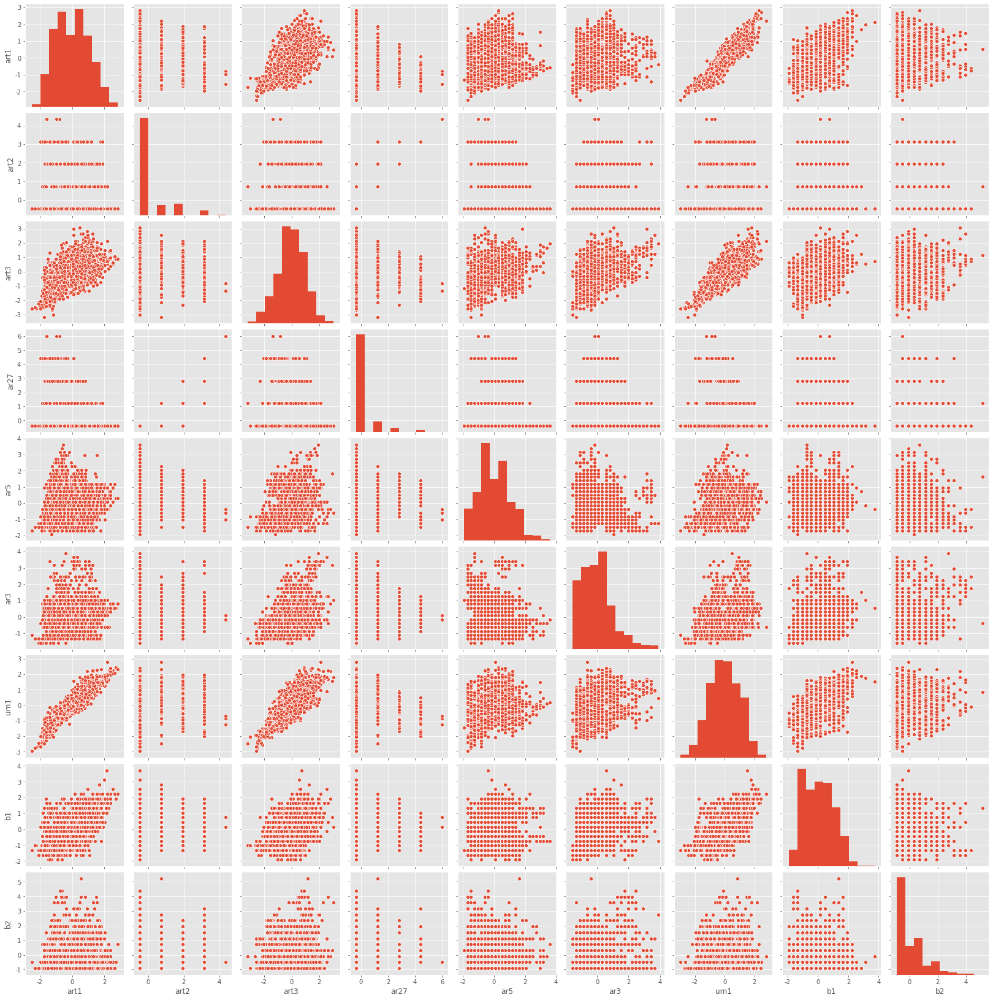

In [314]:
sns.pairplot(X_train[["art1","art2","art3","ar27","ar5","ar3","um1","b1","b2"]])

In [307]:
feature_names = ["f2","f3","x1","x2","n1","p2","p3","um1","uc1","s1","o1","o2","ar1","ar2","ar3","ar4","ar5","ar6","ar7","ar8","ar9","ar10","ar11","ar12","ar13","ar14","ar15","ar16","ar17","ar18","ar20","ar21","ar22","ar23","ar26","ar27","year","day","dayofweek"]

In [308]:
T_train = X_train[feature_names]
print(T_train.shape)
T_train.head()

(1461, 39)


,f2,f3,x1,x2,n1,p2,p3,um1,uc1,s1,...,ar18,ar20,ar21,ar22,ar23,ar26,ar27,year,day,dayofweek
0,0.185103,0.636180,-0.330490,-0.851313,-2.162340,0.340266,-0.422543,-0.058914,0.148462,-0.389954,...,-0.126785,-0.21933,1.709772,-0.342492,-0.297406,-0.026171,-0.37035,2015,1,3
1,-0.861253,0.383197,-0.330490,0.407082,-2.162340,0.379969,-0.140794,-1.115024,-0.215470,-1.031019,...,-0.126785,-0.21933,-1.244229,-0.342492,-0.297406,-0.026171,-0.37035,2015,2,4
2,-0.992048,-0.713061,-0.330490,-0.149913,-2.162340,-0.557960,-1.317174,-1.115024,-0.943334,-0.987557,...,-0.126785,-0.21933,0.417397,-0.342492,-0.297406,-0.026171,-0.37035,2015,3,5
3,-0.551477,0.045887,-0.330490,-0.191172,0.158879,-0.402088,-0.798410,-1.115024,0.330428,-1.346119,...,-0.126785,-0.21933,1.155897,-0.342492,-0.297406,-0.026171,-0.37035,2015,4,6
4,-1.563413,-0.207096,2.784642,0.922817,-2.162340,1.071977,0.939368,-1.907107,-1.307266,-1.856798,...,-0.126785,-0.21933,-0.690354,-0.342492,-0.297406,-0.026171,-0.37035,2015,5,0


In [309]:
T_test = X_test[feature_names]

print(T_test.shape)
T_test.head()

(365, 39)


,f2,f3,x1,x2,n1,p2,p3,um1,uc1,s1,...,ar18,ar20,ar21,ar22,ar23,ar26,ar27,year,day,dayofweek
0,0.989744,-1.423688,-0.645081,-0.462806,0.201454,-0.987793,-0.971490,0.679018,-1.188779,0.650423,...,-0.273975,0.0,1.535669,1.123828,-0.384814,0.0,0.0,2019,1,1
1,1.244570,1.908394,-0.645081,0.386172,0.201454,-0.607788,-1.441581,0.982683,0.528294,0.608445,...,-0.273975,0.0,-1.115986,-0.795972,-0.384814,0.0,0.0,2019,2,2
2,0.177484,-1.423688,-0.645081,-1.021344,0.201454,-0.795835,-0.774129,0.729629,-0.845364,0.608445,...,-0.273975,0.0,1.127722,-0.795972,-0.384814,0.0,0.0,2019,3,3
3,-0.252536,0.956371,-0.645081,-0.775588,0.201454,-1.248335,-1.913734,-0.231978,-0.330242,-0.524985,...,-0.273975,0.0,0.107854,-0.156039,-0.384814,0.0,0.0,2019,4,4
4,-0.571069,-1.106347,-0.645081,-0.440465,0.201454,-0.673364,-1.282450,-0.181367,-0.845364,-0.664915,...,-0.273975,0.0,-0.708039,0.483895,-0.384814,0.0,0.0,2019,5,5


In [310]:
## 정답컬럼 추출
label_name = "count"

Y_train = X_train[label_name]

print(Y_train.shape)
Y_train.head()

(1461,)


0    321
1    271
2    315
3    271
4    109
Name: count, dtype: int64

In [311]:
from sklearn.ensemble import RandomForestRegressor

max_depth_list = []

model = RandomForestRegressor(n_estimators=100,
                              n_jobs=-1,
                              random_state=0)
model

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

In [312]:
# 학습시킴, 피팅(옷을 맞출 때 사용하는 피팅을 생각함) - 피처와 레이블을 넣어주면 알아서 학습을 함
model.fit(T_train, Y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

In [313]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

k_fold = KFold(n_splits=10, shuffle=True, random_state=0)
%time score = cross_val_score(model, T_train,Y_train, cv=k_fold, scoring=rmsle_scorer)
score = score.mean()
# 0에 근접할수록 좋은 데이터
print("Score= {0:.5f}".format(score))

Wall time: 4.13 s
Score= 0.26407


In [314]:
## Test 데이터 예측 진행
pred = model.predict(T_test)
pred = np.round(pred,0).astype(int)
print(pred.shape)
pred[0:10]

(365,)


array([139, 274, 180, 212, 201, 257, 176, 190, 171, 204])

In [315]:
## 해당모델의 점수
print(model.score(T_test,Answer))
print(model.score(T_train,Y_train))
## 약 40%

0.3972652930833288
0.9634196216945877


In [316]:
submission = pd.read_csv("sampleSubmission.csv")
submission

submission["count"] = pred

print(submission.shape)
submission.head()

(365, 2)


,datetime,count
0,2019-01-01,139
1,2019-01-02,274
2,2019-01-03,180
3,2019-01-04,212
4,2019-01-05,201


In [341]:
submission.to_csv(f"submission_7_NEW.csv", index=False)

In [306]:
sub_5 = pd.read_csv("submission_7_NEW.csv", parse_dates=["datetime"])

<function matplotlib.pyplot.show(*args, **kw)>

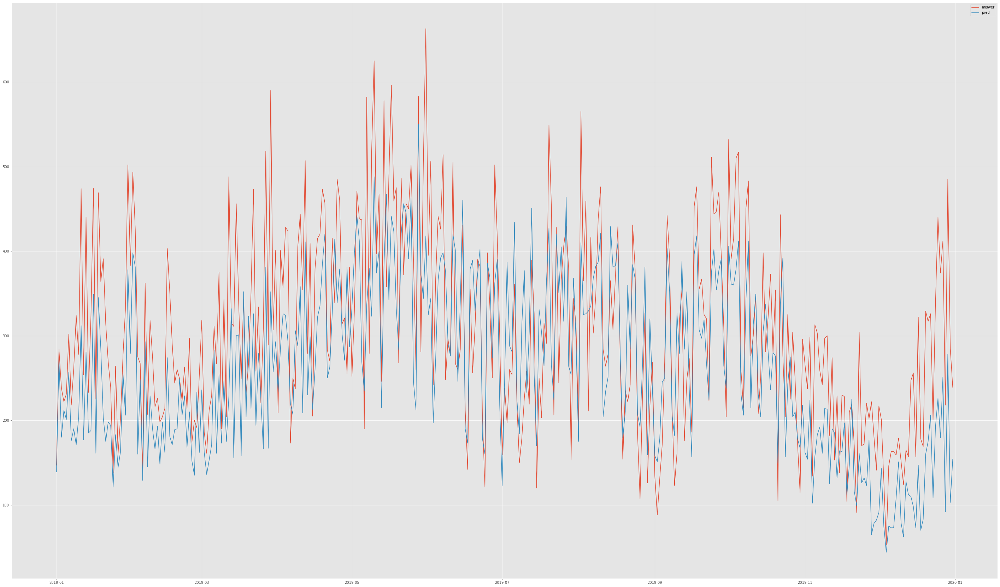

In [343]:
## 정답과 예측 그래프 형태 시각화
x = OriginAnswer['datetime']
y = OriginAnswer['dep_count']
x_1 = sub_5['datetime']
y_1 = sub_5['count']
plt.figure(figsize=(50, 30))
plt.plot(x,y, label = 'answer')
plt.plot(x_1,y_1, label = 'pred')
plt.legend()
plt.show

In [319]:
sub_5 = sub_5['count']
sub_5

0      139
1      274
2      180
3      212
4      201
      ... 
360    251
361     92
362    278
363    103
364    154
Name: count, Length: 365, dtype: int64

In [345]:
import numpy as np
## 절대 평균 오차
def MAE(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred)))

MAE(Answer, sub_5)

73.27671232876712

In [346]:
## 평균 절대 백분율 오차
## 실제값 대비 오차의 절대값들의 평균
def MAPE(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
MAPE(Answer, sub_5)

##25%벗어남 정답에서

25.019817971105457

In [347]:
##예측값과 실제값 차이의 면적의 합
def MSE(y_true, y_pred):
    return np.mean(np.square((y_true - y_pred)))

MSE(Answer, sub_5)

8006.098630136987

In [1070]:
## RMSE란?( Root Mean Squared Error )
## 표준편차와 동일하다. 특정 수치에 대한 예측의 정확도를 표현할 때,
## Accuracy로 판단하기에는 정확도를 올바르게 표기할 수 없어, 
## RMSE 수치로 정확도 판단을 하곤 한다. 일반적으로 해당 수치가 낮을수록 정확도가 높다고 판단한다.
RMSE = MSE(Answer, sub_5)**0.5
RMSE

89.47680498395653

In [348]:
def MPE(y_true, y_pred): 
    return np.mean((y_true - y_pred) / y_true) * 100
MPE(Answer, sub_5)

11.528692736452683

In [349]:
## test 변수 데이터와 sub_2 예측된 데이터의 rmsle 스코어
k_fold = KFold(n_splits=10, shuffle=True, random_state=0)
%time score = cross_val_score(model, T_test,sub_5, cv=k_fold, scoring=rmsle_scorer)
score = score.mean()
# 0에 근접할수록 좋은 데이터
print("Score= {0:.5f}".format(score))

Wall time: 3.2 s
Score= 0.07426


In [1062]:
r2_score(Answer,sub_6)

0.41763431065867485

In [317]:
## 트레인데이터로 적용시켜 만든 모델로 테스트 데이터와 실제 정답을 비교해서 정확도
print(model.score(T_test,Answer))
## 약 40%

0.3972652930833288


In [320]:
print("1. 개월별 평균 절대 백분율 오차")
print("1개월=",(MAPE(Answer[:31], sub_5[:31])))
print("2개월=",(MAPE(Answer[:59], sub_5[:59])))
print("3개월=",(MAPE(Answer[:90], sub_5[:90])))
print("4개월=",(MAPE(Answer[:120], sub_5[:120])))
print("5개월=",(MAPE(Answer[:151], sub_5[:151])))
print("6개월=",(MAPE(Answer[:181], sub_5[:181])))
print("7개월=",(MAPE(Answer[:212], sub_5[:212])))
print("8개월=",(MAPE(Answer[:243], sub_5[:243])))
print("9개월=",(MAPE(Answer[:273], sub_5[:273])))
print("10개월=",(MAPE(Answer[:304], sub_5[:304])))
print("11개월=",(MAPE(Answer[:334], sub_5[:334])))
print("12개월=",(MAPE(Answer[:365], sub_5[:365])))
print("2. 월별별 평균 절대 백분율 오차")
print("1월=",(MAPE(Answer[:31], sub_5[:31])))
print("2월=",(MAPE(Answer[31:59], sub_5[31:59])))
print("3월=",(MAPE(Answer[59:90], sub_5[59:90])))
print("4월=",(MAPE(Answer[90:120], sub_5[90:120])))
print("5월=",(MAPE(Answer[120:151], sub_5[120:151])))
print("6월=",(MAPE(Answer[151:181], sub_5[151:181])))
print("7월=",(MAPE(Answer[181:212], sub_5[181:212])))
print("8월=",(MAPE(Answer[212:243], sub_5[212:243])))
print("9월=",(MAPE(Answer[243:273], sub_5[243:273])))
print("10월=",(MAPE(Answer[273:304], sub_5[273:304])))
print("11월=",(MAPE(Answer[304:334], sub_5[304:334])))
print("12월=",(MAPE(Answer[334:365], sub_5[334:365])))
print("3. 월별 절대 평균 오차")
print("1월=",(MAE(Answer[:31], sub_5[:31])))
print("2월=",(MAE(Answer[31:59], sub_5[31:59])))
print("3월=",(MAE(Answer[59:90], sub_5[59:90])))
print("4월=",(MAE(Answer[90:120], sub_5[90:120])))
print("5월=",(MAE(Answer[120:151], sub_5[120:151])))
print("6월=",(MAE(Answer[151:181], sub_5[151:181])))
print("7월=",(MAE(Answer[181:212], sub_5[181:212])))
print("8월=",(MAE(Answer[212:243], sub_5[212:243])))
print("9월=",(MAE(Answer[243:273], sub_5[243:273])))
print("10월=",(MAE(Answer[273:304], sub_5[273:304])))
print("11월=",(MAE(Answer[304:334], sub_5[304:334])))
print("12월=",(MAE(Answer[334:365], sub_5[334:365])))

1. 개월별 평균 절대 백분율 오차
1개월= 24.509786187971017
2개월= 23.573344636319003
3개월= 24.08391185567143
4개월= 23.344494172793937
5개월= 23.08058462327401
6개월= 22.18072304931134
7개월= 22.95768753275428
8개월= 22.660505262635354
9개월= 22.69468599190006
10개월= 22.412955993234178
11개월= 23.149760950083483
12개월= 25.019817971105457
2. 월별별 평균 절대 백분율 오차
1월= 24.509786187971017
2월= 22.536570061275718
3월= 25.05563656347124
4월= 21.126241124161464
5월= 22.058999270293654
6월= 17.6514197936992
7월= 27.494157581243705
8월= 20.62816199601566
9월= 22.971549898944094
10월= 19.93191439207974
11월= 30.6160511794898
12월= 45.168174262116494
3. 월별 절대 평균 오차
1월= 78.93548387096774
2월= 61.75
3월= 85.70967741935483
4월= 76.96666666666667
5월= 96.7741935483871
6월= 56.56666666666667
7월= 69.48387096774194
8월= 55.54838709677419
9월= 54.333333333333336
10월= 62.29032258064516
11월= 69.6
12월= 109.09677419354838


## ---------------------------------------------------------------------------------------------------------------

## 7. 피쳐임포턴스와 다중공선성을 고려한 모델

In [28]:
feature_names = "um1+p1+n2+month+f1+f3+b3+f2+p2+s2+ar10+dayofweek+week+ar2+art2+p3+o2+p5+ar20+uc1"

In [31]:
y, X = dmatrices("count ~" + feature_names, data=X_train, return_type="dataframe")

vif = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

result = sm.OLS(y, X).fit()

In [32]:
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                  count   R-squared:                       0.766
Model:                            OLS   Adj. R-squared:                  0.763
Method:                 Least Squares   F-statistic:                     235.9
Date:                Mon, 13 Jul 2020   Prob (F-statistic):               0.00
Time:                        15:08:09   Log-Likelihood:                -7937.4
No. Observations:                1461   AIC:                         1.592e+04
Df Residuals:                    1440   BIC:                         1.603e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    284.9362      4.778     59.630      0.0

In [33]:
vif = pd.DataFrame()

In [34]:
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

In [35]:
vif["feature_names"] = X.columns

In [36]:
vif.round(1)

,VIF Factor,feature_names
0,10.7,Intercept
1,33.0,um1
2,274.3,p1
3,168.8,n2
4,22.6,month
5,7.1,f1
6,1.1,f3
7,93.6,b3
8,15.6,f2
9,284.0,p2


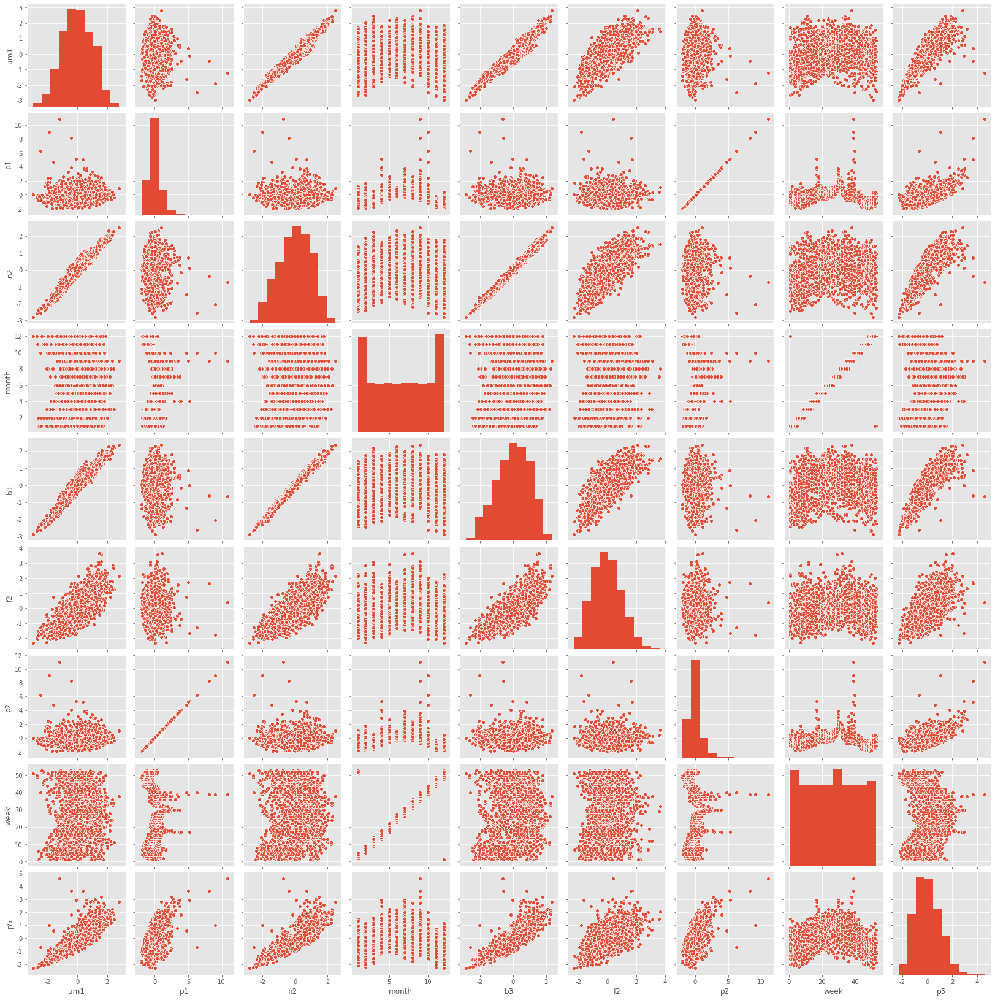

In [37]:
sns.pairplot(X_train[["um1","p1","n2","month","b3","f2","p2","week","p5"]])

- (p1,p2), (b3,n2), (n2,um1)

In [38]:
X_train[['p1','p2','count']].corr(method='pearson')

,p1,p2,count
p1,1.000000,0.996620,0.490146
p2,0.996620,1.000000,0.503864
count,0.490146,0.503864,1.000000


- p2 선택

In [39]:
X_train[['b3','n2','count']].corr(method='pearson')

,b3,n2,count
b3,1.000000,0.991957,0.383107
n2,0.991957,1.000000,0.379038
count,0.383107,0.379038,1.000000


- b3가 n2 보다 count와의 상관관계가 높음 따라서 um1 제거 안해도됨

In [40]:
feature_names = "um1+month+f1+f3+b3+f2+p2+s2+ar10+dayofweek+week+ar2+art2+p3+o2+p5+ar20+uc1"

In [41]:
y, X = dmatrices("count ~" + feature_names, data=X_train, return_type="dataframe")

vif = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

result = sm.OLS(y, X).fit()

In [42]:
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                  count   R-squared:                       0.759
Model:                            OLS   Adj. R-squared:                  0.756
Method:                 Least Squares   F-statistic:                     252.5
Date:                Mon, 13 Jul 2020   Prob (F-statistic):               0.00
Time:                        15:08:26   Log-Likelihood:                -7959.0
No. Observations:                1461   AIC:                         1.596e+04
Df Residuals:                    1442   BIC:                         1.606e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    290.6238      4.764     61.002      0.0

In [43]:
vif = pd.DataFrame()

In [44]:
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

In [45]:
vif["feature_names"] = X.columns

In [46]:
vif.round(1)

,VIF Factor,feature_names
0,10.4,Intercept
1,29.0,um1
2,22.5,month
3,6.8,f1
4,1.1,f3
5,38.3,b3
6,15.2,f2
7,16.1,p2
8,1.0,s2
9,2.0,ar10


In [48]:
feature_names = ["um1","month","f1","f3","b3","f2","p2","s2","ar10","dayofweek","week","ar2","art2","p3","o2","p5","ar20","uc1"]

In [103]:
T_train = X_train[feature_names]
print(T_train.shape)
T_train.head()

(1461, 18)


,um1,month,f1,f3,b3,f2,p2,s2,ar10,dayofweek,week,ar2,art2,p3,o2,p5,ar20,uc1
0,-0.058914,1,-0.180422,0.636180,-0.272303,0.185103,0.340266,-0.042762,-0.466771,3,1,-0.252816,-0.475674,-0.422543,-2.421050,0.096568,-0.21933,0.148462
1,-1.115024,1,-0.180422,0.383197,-1.091819,-0.861253,0.379969,-0.042762,-0.466771,4,1,-0.827128,-0.475674,-0.140794,0.026807,-0.817217,-0.21933,-0.215470
2,-1.115024,1,-0.180422,-0.713061,-1.091819,-0.992048,-0.557960,-0.042762,-0.824002,5,1,-0.663039,-0.475674,-1.317174,0.026807,-1.178269,-0.21933,-0.943334
3,-1.115024,1,0.913342,0.045887,-1.050843,-0.551477,-0.402088,-0.042762,-1.181232,6,1,-0.580995,-0.475674,-0.798410,-2.421050,-1.089591,-0.21933,0.330428
4,-1.907107,1,-0.180422,-0.207096,-2.198165,-1.563413,1.071977,-0.042762,-1.181232,0,2,-1.073262,-0.475674,0.939368,-2.421050,-1.363894,-0.21933,-1.307266


In [104]:
T_test = X_test[feature_names]

print(T_test.shape)
T_test.head()

(365, 18)


,um1,month,f1,f3,b3,f2,p2,s2,ar10,dayofweek,week,ar2,art2,p3,o2,p5,ar20,uc1
0,0.679018,1,0.932320,-1.423688,0.684917,0.989744,-0.987793,-0.070398,-1.188202,1,1,0.628721,-0.089183,-0.971490,-1.413037,-0.102170,0.0,-1.188779
1,0.982683,1,0.932320,1.908394,1.185909,1.244570,-0.607788,-0.070398,1.281228,2,1,1.757790,-0.089183,-1.441581,0.347231,0.557934,0.0,0.528294
2,0.729629,1,-0.034432,-1.423688,0.634818,0.177484,-0.795835,-0.070398,-1.188202,3,1,1.475522,-0.089183,-0.774129,-1.413037,0.069271,0.0,-0.845364
3,-0.231978,1,-0.034432,0.956371,0.083727,-0.252536,-1.248335,-0.070398,-0.879523,4,1,-0.218080,-0.089183,-1.913734,-1.413037,-0.773802,0.0,-0.330242
4,-0.181367,1,-0.034432,-1.106347,-0.116669,-0.571069,-0.673364,-0.070398,0.355192,5,1,0.064187,-0.089183,-1.282450,-1.413037,-0.555273,0.0,-0.845364


In [105]:
## 정답컬럼 추출
label_name = "count"

Y_train = X_train[label_name]

print(Y_train.shape)
Y_train.head()

(1461,)


0    321
1    271
2    315
3    271
4    109
Name: count, dtype: int64

In [106]:
from sklearn.ensemble import RandomForestRegressor

max_depth_list = []

model = RandomForestRegressor(n_estimators=100,
                              n_jobs=-1,
                              random_state=0)
model

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

In [107]:
# 학습시킴, 피팅(옷을 맞출 때 사용하는 피팅을 생각함) - 피처와 레이블을 넣어주면 알아서 학습을 함
model.fit(T_train, Y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=-1, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

In [108]:
from sklearn.metrics import make_scorer

def rmsle(predicted_values, actual_values):
    # 넘파이로 배열 형태로 바꿔준다.
    predicted_values = np.array(predicted_values)
    actual_values = np.array(actual_values)
    
    # 예측값과 실제 값에 1을 더하고 로그를 씌워준다.
    log_predict = np.log(predicted_values + 1)
    log_actual = np.log(actual_values + 1)
    
    # 위에서 계산한 예측값에서 실제값을 빼주고 제곱을 해준다.
    difference = log_predict - log_actual
    # difference = (log_predict - log_actual) ** 2
    difference = np.square(difference)
    
    # 평균을 낸다.
    mean_difference = difference.mean()
    
    # 다시 루트를 씌운다.
    score = np.sqrt(mean_difference)
    
    return score

rmsle_scorer = make_scorer(rmsle)
rmsle_scorer

make_scorer(rmsle)

In [109]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

k_fold = KFold(n_splits=10, shuffle=True, random_state=0)
%time score = cross_val_score(model, T_train,Y_train, cv=k_fold, scoring=rmsle_scorer)
score = score.mean()
# 0에 근접할수록 좋은 데이터
print("Score= {0:.5f}".format(score))

Wall time: 3.48 s
Score= 0.26328


In [58]:
pred = model.predict(T_test)
pred = np.round(pred,0).astype(int)
print(pred.shape)
pred[0:10]

(365,)


array([151, 261, 216, 207, 231, 244, 190, 202, 193, 207])

In [113]:
submission = pd.read_csv("sampleSubmission_2.csv")
submission

submission["count"] = pred

print(submission.shape)
submission.head()

(31, 2)


,datetime,count
0,2019-01-01,151
1,2019-01-02,261
2,2019-01-03,216
3,2019-01-04,207
4,2019-01-05,231


In [114]:
submission

,datetime,count
0,2019-01-01,151
1,2019-01-02,261
2,2019-01-03,216
3,2019-01-04,207
4,2019-01-05,231
5,2019-01-06,244
6,2019-01-07,190
7,2019-01-08,202
8,2019-01-09,193
9,2019-01-10,207


In [390]:
submission.to_csv(f"submission_8_NEW.csv", index=False)

In [321]:
sub_6 = pd.read_csv("submission_8_NEW.csv", parse_dates=["datetime"])

<function matplotlib.pyplot.show(*args, **kw)>

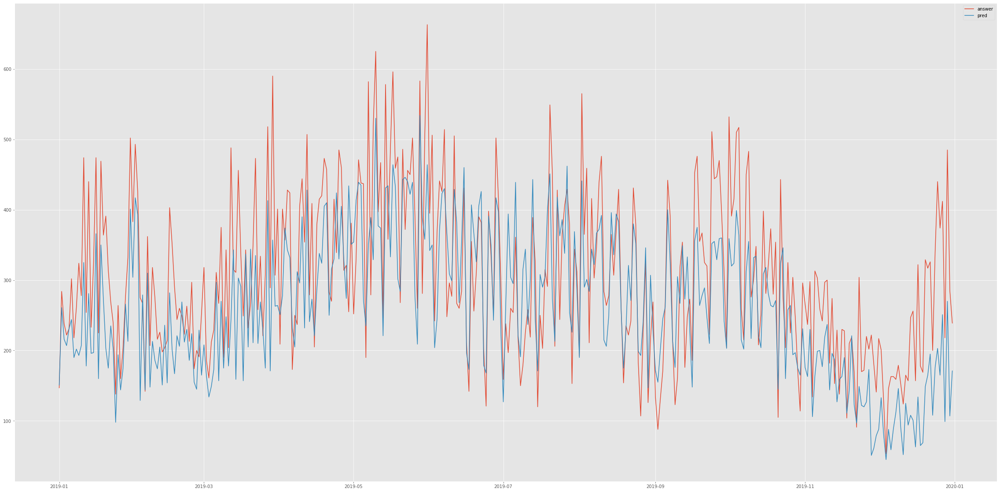

In [61]:
## 정답과 예측 그래프 형태 시각화
x = OriginAnswer['datetime']
y = OriginAnswer['dep_count']
x_1 = sub_6['datetime']
y_1 = sub_6['count']
plt.figure(figsize=(40, 20))
plt.plot(x,y, label = 'answer')
plt.plot(x_1,y_1, label = 'pred')
plt.legend()
plt.show

In [322]:
sub_6 = sub_6['count']
sub_6

0      151
1      261
2      216
3      207
4      231
      ... 
360    251
361     99
362    270
363    107
364    171
Name: count, Length: 365, dtype: int64

In [67]:
Answer = OriginAnswer['dep_count']

In [68]:
import numpy as np
## 절대 평균 오차
def MAE(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred)))

MAE(Answer, sub_6)

71.67671232876712

In [69]:
## 평균 절대 백분율 오차
## 실제값 대비 오차의 절대값들의 평균
def MAPE(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
MAPE(Answer, sub_6)

24.44756796131847

In [283]:
print("1. 개월별 평균 절대 백분율 오차")
print("1개월=",(MAPE(Answer[:31], sub_6[:31])))
print("2개월=",(MAPE(Answer[:59], sub_6[:59])))
print("3개월=",(MAPE(Answer[:90], sub_6[:90])))
print("4개월=",(MAPE(Answer[:120], sub_6[:120])))
print("5개월=",(MAPE(Answer[:151], sub_6[:151])))
print("6개월=",(MAPE(Answer[:181], sub_6[:181])))
print("7개월=",(MAPE(Answer[:212], sub_6[:212])))
print("8개월=",(MAPE(Answer[:243], sub_6[:243])))
print("9개월=",(MAPE(Answer[:273], sub_6[:273])))
print("10개월=",(MAPE(Answer[:304], sub_6[:304])))
print("11개월=",(MAPE(Answer[:334], sub_6[:334])))
print("12개월=",(MAPE(Answer[:365], sub_6[:365])))
print("2. 월별별 평균 절대 백분율 오차")
print("1월=",(MAPE(Answer[:31], sub_6[:31])))
print("2월=",(MAPE(Answer[31:59], sub_6[31:59])))
print("3월=",(MAPE(Answer[59:90], sub_6[59:90])))
print("4월=",(MAPE(Answer[90:120], sub_6[90:120])))
print("5월=",(MAPE(Answer[120:151], sub_6[120:151])))
print("6월=",(MAPE(Answer[151:181], sub_6[151:181])))
print("7월=",(MAPE(Answer[181:212], sub_6[181:212])))
print("8월=",(MAPE(Answer[212:243], sub_6[212:243])))
print("9월=",(MAPE(Answer[243:273], sub_6[243:273])))
print("10월=",(MAPE(Answer[273:304], sub_6[273:304])))
print("11월=",(MAPE(Answer[304:334], sub_6[304:334])))
print("12월=",(MAPE(Answer[334:365], sub_6[334:365])))
print("3. 월별 절대 평균 오차")
print("1월=",(MAE(Answer[:31], sub_6[:31])))
print("2월=",(MAE(Answer[31:59], sub_6[31:59])))
print("3월=",(MAE(Answer[59:90], sub_6[59:90])))
print("4월=",(MAE(Answer[90:120], sub_6[90:120])))
print("5월=",(MAE(Answer[120:151], sub_6[120:151])))
print("6월=",(MAE(Answer[151:181], sub_6[151:181])))
print("7월=",(MAE(Answer[181:212], sub_6[181:212])))
print("8월=",(MAE(Answer[212:243], sub_6[212:243])))
print("9월=",(MAE(Answer[243:273], sub_6[243:273])))
print("10월=",(MAE(Answer[273:304], sub_6[273:304])))
print("11월=",(MAE(Answer[304:334], sub_6[304:334])))
print("12월=",(MAE(Answer[334:365], sub_6[334:365])))

1. 개월별 평균 절대 백분율 오차
1개월= 22.017159290873295
2개월= 21.52594404910466
3개월= 22.74807777019124
4개월= 22.318593324128692
5개월= 22.07420945330351
6개월= 21.13045810849912
7개월= 21.88681900277051
8개월= 21.289264202199426
9개월= 21.77527392771027
10개월= 21.68510897746879
11개월= 22.40769325897343
12개월= 24.44756796131847
2. 월별별 평균 절대 백분율 오차
1월= 22.017159290873295
2월= 20.98209860286082
3월= 25.074074207097958
4월= 21.03013998594107
5월= 21.12820737268992
6월= 16.38024300631701
7월= 26.30299067577439
8월= 17.202760404745565
9월= 25.711952704348118
10월= 20.89107570598729
11월= 29.729880644887167
12월= 46.42557281884242
3. 월별 절대 평균 오차
1월= 71.09677419354838
2월= 57.5
3월= 85.12903225806451
4월= 73.43333333333334
5월= 90.70967741935483
6월= 51.266666666666666
7월= 66.25806451612904
8월= 48.41935483870968
9월= 65.43333333333334
10월= 68.45161290322581
11월= 67.16666666666667
12월= 112.93548387096774


In [70]:
##예측값과 실제값 차이의 면적의 합
def MSE(y_true, y_pred):
    return np.mean(np.square((y_true - y_pred)))

MSE(Answer, sub_6)

7732.816438356164

In [244]:
## RMSE란?( Root Mean Squared Error )
## 표준편차와 동일하다. 특정 수치에 대한 예측의 정확도를 표현할 때,
## Accuracy로 판단하기에는 정확도를 올바르게 표기할 수 없어, 
## RMSE 수치로 정확도 판단을 하곤 한다. 일반적으로 해당 수치가 낮을수록 정확도가 높다고 판단한다.
RMSE = MSE(Answer, sub_6)
RMSE

7732.816438356164

In [119]:
from sklearn.metrics import mean_squared_error
from math import sqrt
rms = sqrt(mean_squared_error(Answer, sub_6))
rms

87.18944890294927

In [73]:
def MPE(y_true, y_pred): 
    return np.mean((y_true - y_pred) / y_true) * 100
MPE(Answer, sub_6)

11.412815368061452

In [243]:
## test 변수 데이터와 sub_2 예측된 데이터의 rmsle 스코어
k_fold = KFold(n_splits=10, shuffle=True, random_state=0)
%time score = cross_val_score(model, T_test,sub_6, cv=k_fold, scoring=rmsle_scorer)
score = score.mean()
# 0에 근접할수록 좋은 데이터
print("Score= {0:.5f}".format(score))

Wall time: 3.29 s
Score= 0.08529


In [77]:
import numpy as np
from sklearn import metrics
import matplotlib.pyplot as plt

In [78]:
y = np.array(sub_6)

In [81]:
import numpy as np 
import matplotlib.pyplot as plt 

from sklearn.metrics import accuracy_score, precision_score, precision_recall_curve
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_curve, roc_auc_score

from sklearn.linear_model import LogisticRegression

In [96]:
## 해당모델의 점수
print(model.score(T_test,Answer))
## 약 42% 정확도

0.4178255375406167


In [163]:
T_test[31:59]

,um1,month,f1,f3,b3,f2,p2,s2,ar10,dayofweek,week,ar2,art2,p3,o2,p5,ar20,uc1
31,-0.282589,2,-0.034432,0.004347,-0.216868,-0.252536,1.062551,-8.635548,-0.262165,4,5,-0.218080,-0.089183,0.017348,-1.413037,0.333176,0.0,1.043416
32,-0.788698,2,-1.001185,-0.947677,-0.617661,-0.897566,1.304811,-0.070398,0.972549,5,5,-1.629416,-0.089183,-0.092215,-1.413037,-0.158159,0.0,0.528294
33,-0.940531,2,1.899073,-0.154323,-0.868157,0.105814,-0.014722,-0.070398,-0.879523,6,5,-1.629416,-0.089183,-0.290843,-1.413037,-0.769308,0.0,-1.188779
34,-0.940531,2,0.932320,-0.154323,-0.667760,-0.188829,-0.528710,-0.070398,1.898585,0,6,-1.064882,-1.391261,-1.663270,0.347231,-0.811534,0.0,0.184879
35,-0.636865,2,0.932320,-0.630335,-0.717859,0.065997,-1.043746,-0.070398,-1.188202,1,6,-0.782615,-0.089183,-1.019321,-1.413037,-1.008050,0.0,-1.188779
36,0.577796,2,0.932320,1.591053,1.135810,1.762187,-0.926922,-0.070398,1.589907,2,6,1.193255,-0.089183,-1.889436,0.347231,0.328116,0.0,0.700001
37,0.021076,2,-0.034432,-0.630335,-0.216868,-0.101232,-1.056512,-0.070398,-0.262165,3,6,-0.359214,-0.089183,-1.174948,-1.413037,-0.689352,0.0,-1.188779
38,0.071687,2,-0.034432,-0.630335,0.434422,-0.085306,-1.198115,-0.070398,-0.879523,4,6,0.346454,-0.089183,-1.496540,-1.413037,-0.436434,0.0,-0.330242
39,-0.383811,2,0.932320,-0.947677,-0.166768,0.225264,-0.883086,-0.070398,0.355192,5,6,-0.218080,-0.089183,-1.497158,-1.413037,-0.713124,0.0,-0.673657
40,-0.282589,2,0.932320,-0.630335,-0.166768,0.065997,-1.413233,-0.070398,-0.879523,6,6,-0.500347,-0.089183,-1.565753,-1.413037,-0.846399,0.0,-0.673657


In [144]:
pred = model.predict(T_test_1m)
pred = np.round(pred,0).astype(int)
print(pred.shape)
pred

(27,)


array([417, 393, 129, 279, 144, 310, 148, 213, 186, 174, 205, 151, 236,
       154, 282, 202, 167, 221, 206, 269, 212, 230, 186, 224, 155, 145,
       229])

In [147]:
sub_6[31:58]

31    417
32    393
33    129
34    279
35    144
36    310
37    148
38    213
39    186
40    174
41    205
42    151
43    236
44    154
45    282
46    202
47    167
48    221
49    206
50    269
51    212
52    230
53    186
54    224
55    155
56    145
57    229
Name: count, dtype: int64

## --------------------------------------------------------------------------------------------------------------------------------

## 9. Arima를 사용한 시계열 예측

In [331]:
import warnings
import itertools
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

0      147
1      284
2      238
3      222
4      231
      ... 
360    412
361    218
362    485
363    285
364    239
Name: dep_count, Length: 365, dtype: int64

In [332]:
data = sm.datasets.co2.load_pandas()
y = data.data

In [333]:
y

,co2
1958-03-29,316.1
1958-04-05,317.3
1958-04-12,317.6
1958-04-19,317.5
1958-04-26,316.4
...,...
2001-12-01,370.3
2001-12-08,370.8
2001-12-15,371.2
2001-12-22,371.3


In [334]:
data = pd.read_csv("arima_2.csv", parse_dates=["datetime"])
y = data
y

,datetime,count
0,2015-01-01,6967
1,2015-02-01,5272
2,2015-03-01,7949
3,2015-04-01,8667
4,2015-05-01,9951
5,2015-06-01,6928
6,2015-07-01,8810
7,2015-08-01,8260
8,2015-09-01,6162
9,2015-10-01,7200


In [335]:
y.set_index('datetime',inplace=True)

In [336]:
y = y.astype(int)
y

,count
datetime,
2015-01-01,6967
2015-02-01,5272
2015-03-01,7949
2015-04-01,8667
2015-05-01,9951
2015-06-01,6928
2015-07-01,8810
2015-08-01,8260
2015-09-01,6162


In [337]:
# The 'MS' string groups the data in buckets by start of the month
y = y
# The term bfill means that we use the value before filling in missing values
y = y.fillna(y.bfill())

print(y)

            count
datetime         
2015-01-01   6967
2015-02-01   5272
2015-03-01   7949
2015-04-01   8667
2015-05-01   9951
2015-06-01   6928
2015-07-01   8810
2015-08-01   8260
2015-09-01   6162
2015-10-01   7200
2015-11-01   4622
2015-12-01   4129
2016-01-01   5681
2016-02-01   5388
2016-03-01   7269
2016-04-01   8753
2016-05-01   9002
2016-06-01   8752
2016-07-01   9427
2016-08-01   7663
2016-09-01   7137
2016-10-01   6751
2016-11-01   5181
2016-12-01   5627
2017-01-01   6827
2017-02-01   6469
2017-03-01   9836
2017-04-01  11472
2017-05-01  10992
2017-06-01  10279
2017-07-01   9961
2017-08-01   8785
2017-09-01   9626
2017-10-01   8901
2017-11-01   5643
2017-12-01   5718
2018-01-01   7391
2018-02-01   5979
2018-03-01   8869
2018-04-01  11450
2018-05-01  12609
2018-06-01  10733
2018-07-01  10569
2018-08-01  10083
2018-09-01   8494
2018-10-01   9240
2018-11-01   6321
2018-12-01   6246
2019-01-01   9528
2019-02-01   7638
2019-03-01  10013
2019-04-01  10802
2019-05-01  13404
2019-06-01

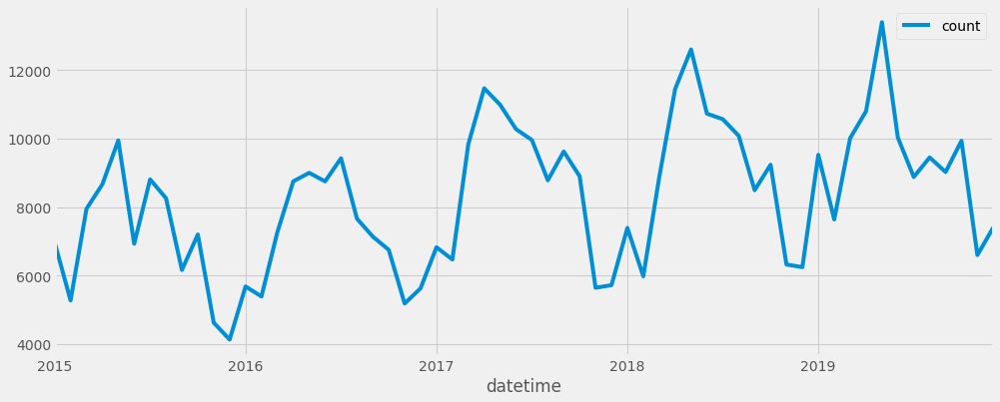

In [338]:
y.plot(figsize=(15, 6))
plt.show()

In [339]:
# Define the p, d and q parameters to take any value between 0 and 2
p = d = q = range(0, 2)

# Generate all different combinations of p, q and q triplets
pdq = list(itertools.product(p, d, q))

# Generate all different combinations of seasonal p, q and q triplets
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [340]:
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

            results = mod.fit()

            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:1237.9294765217362
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:946.6252677224109
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:802.4916298899793
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:1438.371003351956
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:813.0948554186948
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:794.5102908585155
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:621.5832313334532
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:1493.390250699314
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:1178.84649702931
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:930.1062196509789
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:776.1632814460716
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:1443.8624134697948
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:809.5857989035478
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:772.1263288811994
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:606.1744014112004
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:1439.611592741426
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:1029.9714089893432
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:794.0909088471261
ARIMA(0,

In [341]:
mod = sm.tsa.statespace.SARIMAX(y,
                                order=(1, 1, 1),
                                seasonal_order=(1, 1, 0, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)

results = mod.fit()

print(results.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3345      0.277      1.207      0.227      -0.209       0.878
ma.L1         -0.9161      0.157     -5.818      0.000      -1.225      -0.607
ar.S.L12      -0.2770      0.203     -1.363      0.173      -0.675       0.121
sigma2      8.679e+05   2.75e+05      3.160      0.002     3.3e+05    1.41e+06


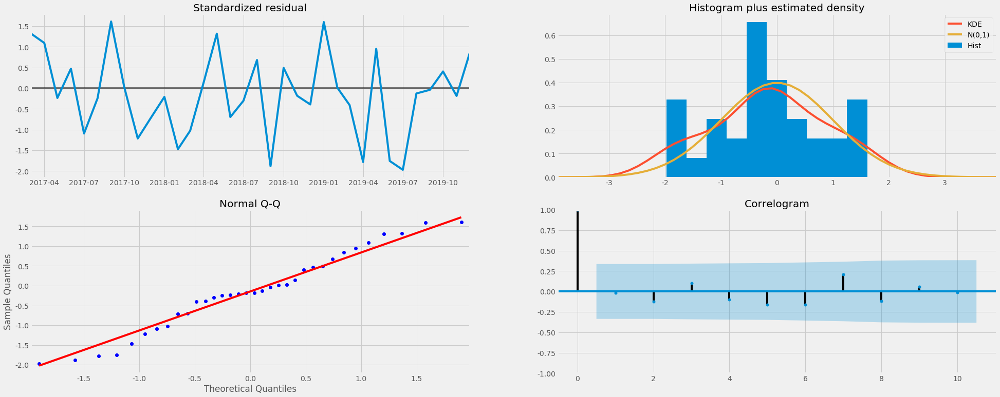

In [342]:
results.plot_diagnostics(figsize=(30, 12))
plt.show()

In [343]:
pred = results.get_prediction(start=pd.to_datetime('2018-01-01'), dynamic=False)
pred_ci = pred.conf_int()
pred

In [344]:
pred_ci

,lower count,upper count
2018-01-01,5754.575988,9420.177916
2018-02-01,5523.512903,9186.835702
2018-03-01,7997.923529,11659.358635
2018-04-01,9485.637253,13145.505467
2018-05-01,9550.235800,13208.801051
2018-06-01,9554.016551,13211.496682
2018-07-01,9023.237878,12679.813181
2018-08-01,7619.884565,11275.704588
2018-09-01,8422.402303,12077.591329
2018-10-01,6955.113008,10609.774484


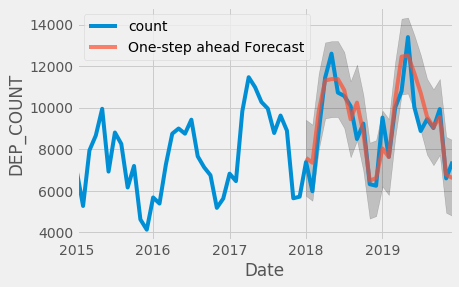

In [345]:
ax = y['2015':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7)

ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('DEP_COUNT')
plt.legend()

plt.show()

In [347]:
y_forecasted = pd.read_csv("arima_result_2.csv",parse_dates=["datetime"])

In [348]:
y_forecasted.set_index('datetime',inplace=True)

In [349]:
y_forecasted =  y_forecasted['count']

In [350]:
y_forecasted

datetime
2018-01-01     7587
2018-02-01     7355
2018-03-01     9828
2018-04-01    11315
2018-05-01    11379
2018-06-01    11382
2018-07-01    10851
2018-08-01     9447
2018-09-01    10249
2018-10-01     8782
2018-11-01     6491
2018-12-01     6611
2019-01-01     8038
2019-02-01     7626
2019-03-01    10392
2019-04-01    12462
2019-05-01    12515
2019-06-01    11671
2019-07-01    10718
2019-08-01     9570
2019-09-01     9062
2019-10-01     9561
2019-11-01     6772
2019-12-01     6615
Name: count, dtype: int64

In [351]:
y_truth = y[36:]['count']

In [352]:
y_truth

datetime
2018-01-01     7391
2018-02-01     5979
2018-03-01     8869
2018-04-01    11450
2018-05-01    12609
2018-06-01    10733
2018-07-01    10569
2018-08-01    10083
2018-09-01     8494
2018-10-01     9240
2018-11-01     6321
2018-12-01     6246
2019-01-01     9528
2019-02-01     7638
2019-03-01    10013
2019-04-01    10802
2019-05-01    13404
2019-06-01    10033
2019-07-01     8881
2019-08-01     9452
2019-09-01     9026
2019-10-01     9939
2019-11-01     6599
2019-12-01     7406
Name: count, dtype: int32

In [354]:
## 평균 절대 백분율 오차
## 실제값 대비 오차의 절대값들의 평균
def MAPE(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
MAPE(y_truth, y_forecasted)

8.080430304623315

In [360]:
y_2018 = y_truth[:12]

In [362]:
y_for_2018 = y_forecasted[:12]

In [364]:
y_2019 = y_truth[12:24]

In [366]:
y_for_2019 = y_forecasted[12:24]

In [363]:
##2018년 절대평균오차백분율
MAPE(y_2018 , y_for_2018)

8.04890133917602

In [367]:
##2019년 절대평균오차백분율
MAPE(y_2019 , y_for_2019)

8.11195927007061

In [381]:
y_truth[:1]

datetime
2018-01-01    7391
Name: count, dtype: int32

In [382]:
print("1. 월별 절대평균오차백분율")
print("2018년 1월=",MAPE(y_truth[:1] , y_forecasted[:1]))
print("2018년 2월=",MAPE(y_truth[1:2] , y_forecasted[1:2]))
print("2018년 3월=",MAPE(y_truth[2:3] , y_forecasted[2:3]))
print("2018년 4월=",MAPE(y_truth[3:4] , y_forecasted[3:4]))
print("2018년 5월=",MAPE(y_truth[4:5] , y_forecasted[4:5]))
print("2018년 6월=",MAPE(y_truth[5:6] , y_forecasted[5:6]))
print("2018년 7월=",MAPE(y_truth[6:7] , y_forecasted[6:7]))
print("2018년 8월=",MAPE(y_truth[7:8] , y_forecasted[7:8]))
print("2018년 9월=",MAPE(y_truth[8:9] , y_forecasted[8:9]))
print("2018년 10월=",MAPE(y_truth[9:10] , y_forecasted[9:10]))
print("2018년 11월=",MAPE(y_truth[10:11] , y_forecasted[10:11]))
print("2018년 12월=",MAPE(y_truth[11:12] , y_forecasted[11:12]))
print("2019년1월=",MAPE(y_truth[12:13] , y_forecasted[12:13]))
print("2019년 2월=",MAPE(y_truth[13:14] , y_forecasted[13:14]))
print("2019년 3월=",MAPE(y_truth[14:15] , y_forecasted[14:15]))
print("2019년 4월=",MAPE(y_truth[15:16] , y_forecasted[15:16]))
print("2019년 5월=",MAPE(y_truth[16:17] , y_forecasted[16:17]))
print("2019년 6월=",MAPE(y_truth[17:18] , y_forecasted[17:18]))
print("2019년 7월=",MAPE(y_truth[18:19] , y_forecasted[18:19]))
print("2019년 8월=",MAPE(y_truth[19:20] , y_forecasted[19:20]))
print("2019년 9월=",MAPE(y_truth[20:21] , y_forecasted[20:21]))
print("2019년 10월=",MAPE(y_truth[21:22] , y_forecasted[21:22]))
print("2019년 11월=",MAPE(y_truth[22:23] , y_forecasted[22:23]))
print("2019년 12월=",MAPE(y_truth[23:24] , y_forecasted[23:24]))

1. 월별 절대평균오차백분율
2018년 1월= 2.6518739006900285
2018년 2월= 23.01388192005352
2018년 3월= 10.812943962115233
2018년 4월= 1.1790393013100438
2018년 5월= 9.754936949797763
2018년 6월= 6.046771638870772
2018년 7월= 2.6681805279591257
2018년 8월= 6.307646533769712
2018년 9월= 20.661643513068046
2018년 10월= 4.956709956709957
2018년 11월= 2.6894478721721247
2018년 12월= 5.843739993595901
2019년1월= 15.638119227539882
2019년 2월= 0.15710919088766695
2019년 3월= 3.7850793967841807
2019년 4월= 15.36752453249398
2019년 5월= 6.6323485526708446
2019년 6월= 16.32612379148809
2019년 7월= 20.684607589235444
2019년 8월= 1.2484130342784596
2019년 9월= 0.3988477730999336
2019년 10월= 3.8031995170540296
2019년 11월= 2.621609334747689
2019년 12월= 10.680529300567109


In [376]:
print("2. 개월별 절대평균오차백분율")
print("2018년 1개월=",MAPE(y_truth[:1] , y_forecasted[:1]))
print("2018년 2개월=",MAPE(y_truth[:2] , y_forecasted[:2]))
print("2018년 3개월=",MAPE(y_truth[:3] , y_forecasted[:3]))
print("2018년 4개월=",MAPE(y_truth[:4] , y_forecasted[:4]))
print("2018년 5개월=",MAPE(y_truth[:5] , y_forecasted[:5]))
print("2018년 6개월=",MAPE(y_truth[:6] , y_forecasted[:6]))
print("2018년 7개월=",MAPE(y_truth[:7] , y_forecasted[:7]))
print("2018년 8개월=",MAPE(y_truth[:8] , y_forecasted[:8]))
print("2018년 9개월=",MAPE(y_truth[:9] , y_forecasted[:9]))
print("2018년 10개월=",MAPE(y_truth[:10] , y_forecasted[:10]))
print("2018년 11개월=",MAPE(y_truth[:11] , y_forecasted[:11]))
print("2018년 12개월=",MAPE(y_truth[:12] , y_forecasted[:12]))
print("2019년 1개월=",MAPE(y_truth[:13] , y_forecasted[:13]))
print("2019년 2개월=",MAPE(y_truth[:14] , y_forecasted[:14]))
print("2019년 3개월=",MAPE(y_truth[:15] , y_forecasted[:15]))
print("2019년 4개월=",MAPE(y_truth[:16] , y_forecasted[:16]))
print("2019년 5개월=",MAPE(y_truth[:17] , y_forecasted[:17]))
print("2019년 6개월=",MAPE(y_truth[:18] , y_forecasted[:18]))
print("2019년 7개월=",MAPE(y_truth[:19] , y_forecasted[:19]))
print("2019년 8개월=",MAPE(y_truth[:20] , y_forecasted[:20]))
print("2019년 9개월=",MAPE(y_truth[:21] , y_forecasted[:21]))
print("2019년 10개월=",MAPE(y_truth[:22] , y_forecasted[:22]))
print("2019년 11개월=",MAPE(y_truth[:23] , y_forecasted[:23]))
print("2019년 12개월=",MAPE(y_truth[:24] , y_forecasted[:24]))

2. 개월별 절대평균오차백분율
2018년 1개월= 2.6518739006900285
2018년 2개월= 12.832877910371773
2018년 3개월= 12.15956659428626
2018년 4개월= 9.414434771042206
2018년 5개월= 9.482535206793315
2018년 6개월= 8.909907945472893
2018년 7개월= 8.018232600113784
2018년 8개월= 7.804409341820776
2018년 9개월= 9.232990916403807
2018년 10개월= 8.805362820434421
2018년 11개월= 8.249370552410577
2018년 12개월= 8.04890133917602
2019년 1개월= 8.632687330588624
2019년 2개월= 8.027288892038555
2019년 3개월= 7.744474925688265
2019년 4개월= 8.220915526113624
2019년 5개월= 8.127470410028755
2019년 6개월= 8.58295115344316
2019년 7개월= 9.219880439537492
2019년 8개월= 8.821307069274539
2019년 9개월= 8.42023757898051
2019년 10개월= 8.210372212529307
2019년 11개월= 7.9673825221909755
2019년 12개월= 8.080430304623315


In [369]:
y_truth[:1]

datetime
2018-01-01    7391
Name: count, dtype: int32

In [385]:
## 평균 절대 백분율 오차
## 실제값 대비 오차의 절대값들의 평균
def MAPE(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
MAPE(y_truth, y_forecasted)

8.080430304623315

In [386]:
y_truth

datetime
2018-01-01     7391
2018-02-01     5979
2018-03-01     8869
2018-04-01    11450
2018-05-01    12609
2018-06-01    10733
2018-07-01    10569
2018-08-01    10083
2018-09-01     8494
2018-10-01     9240
2018-11-01     6321
2018-12-01     6246
2019-01-01     9528
2019-02-01     7638
2019-03-01    10013
2019-04-01    10802
2019-05-01    13404
2019-06-01    10033
2019-07-01     8881
2019-08-01     9452
2019-09-01     9026
2019-10-01     9939
2019-11-01     6599
2019-12-01     7406
Name: count, dtype: int32

In [387]:
mse = ((y_forecasted - y_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))

The Mean Squared Error of our forecasts is 896702.75


In [388]:
##예측값과 실제값 차이의 면적의 합
def MSE(y_true, y_pred):
    return np.mean(np.square((y_true - y_pred)))

MSE(y_truth, y_forecasted)

896702.75

In [389]:
# Get forecast 500 steps ahead in future
pred_uc = results.get_forecast(steps=200)

# Get confidence intervals of forecasts
pred_ci = pred_uc.conf_int()
pred_ci

,lower count,upper count
2020-01-01,7973.075142,11625.207249
2020-02-01,5913.744606,9872.832596
2020-03-01,8339.994625,12382.694134
2020-04-01,9588.062517,13672.177394
2020-05-01,11769.535683,15884.211960
...,...,...
2036-04-01,-8396.086872,47559.600819
2036-05-01,-6284.896512,50017.720770
2036-06-01,-9504.327741,47140.800518
2036-07-01,-10612.354184,46372.465326


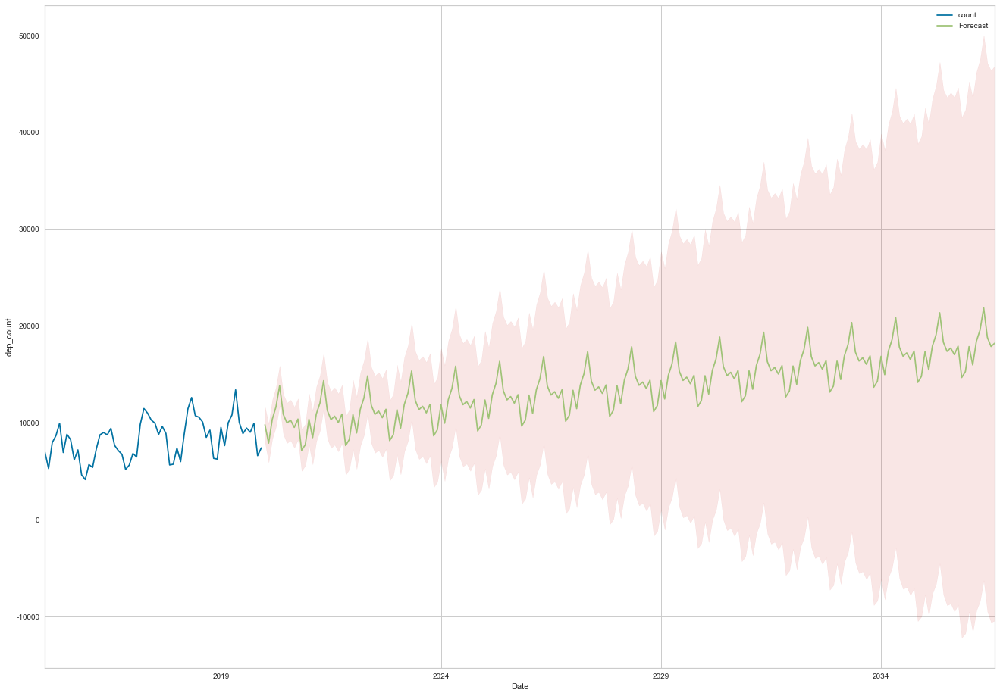

In [1095]:
ax = y.plot(label='observed', figsize=(20, 15))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='r', alpha=.100)
ax.set_xlabel('Date')
ax.set_ylabel('dep_count')

plt.legend()
plt.show()